### Work flow of stat arb on one pair (x = axisbank,y = HDFC)

In [1]:
import pandas as pd 
import numpy as np 
import datetime 
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import nsepy 
import os
import cufflinks as cf
%matplotlib inline 
plt.style.use('ggplot')

In [2]:
pd.read_csv('C:\\Users\\sahil\\Documents\\learning\\springborad projects\\capstone_project_1\\data' + "\\" + "HDFC.csv",index_col = 0)

,Ticker,Open,High,Low,Close
2014-01-01 09:15:00,HDFC.EQ-NSE,798.25,800.10,796.45,798.95
2014-01-01 09:16:00,HDFC.EQ-NSE,798.85,799.00,798.00,798.55
2014-01-01 09:17:00,HDFC.EQ-NSE,798.65,798.75,798.00,798.00
2014-01-01 09:18:00,HDFC.EQ-NSE,798.00,798.10,797.50,797.95
2014-01-01 09:19:00,HDFC.EQ-NSE,797.50,797.95,797.10,797.30
...,...,...,...,...,...
2020-09-09 15:26:00,HDFC.EQ-NSE,1760.15,1761.00,1760.10,1761.00
2020-09-09 15:27:00,HDFC.EQ-NSE,1761.00,1762.80,1760.75,1762.50
2020-09-09 15:28:00,HDFC.EQ-NSE,1762.95,1764.35,1761.55,1762.85
2020-09-09 15:29:00,HDFC.EQ-NSE,1763.70,1764.15,1761.50,1763.50


### Loading data and preparing data 

In [3]:
path = 'C:\\Users\\sahil\\Documents\\learning\\springborad projects\\capstone_project_1\\data'

# setting resample freq as data i am going load is at 1 min freq
resample_freq = "60T"

x_name =  "AXISBANK.csv"
y_name =  "HDFC.csv"  
 
# reading x and y data    
x = pd.read_csv(path + "\\" + x_name,index_col = 0,parse_dates = True)
y = pd.read_csv(path + "\\" + y_name,index_col = 0,parse_dates = True)


# getting close price of x and y convetring it into dataframes
x = x.Close.to_frame()
y = y.Close.to_frame()

# naming the columns 
x.columns = [x_name]
y.columns = [y_name]

# concatenating x and y into one dataframe
df = pd.concat([x,y],axis = 1)

# dropping nan values that might have genrated after concatenating
df.dropna(inplace=True)
df.sort_index(inplace=True)

# resampling the df to desired freq and dropping nan if genrated after resampling 
df = df.resample(resample_freq).last().dropna().copy()

In [4]:
df.head()

,AXISBANK.csv,HDFC.csv
2014-01-01 09:00:00,258.86,797.25
2014-01-01 10:00:00,259.34,797.35
2014-01-01 11:00:00,258.75,791.05
2014-01-01 12:00:00,259.01,792.50
2014-01-01 13:00:00,259.01,793.00


### Func to get rolling ADF values of any series 
* on rolling basis i can check if the series is stationary or not 

In [5]:
def rolling_adf(series,rolling_n):

    adf_values = list(np.zeros(rolling_n))
    
    for index,datetime in enumerate(series.index):

        if index >= rolling_n:
            start = index - rolling_n

            ser = series.iloc[start:index]
            adf = adfuller(ser, maxlag = 1)

            adf_values.append(adf[0])
            
    return adf_values 

### Func to calc rolling mean and std of any Series 
* so on rolling basis we can track if series have deviated beyond +2 and -2 std so i can take trade 

In [6]:
def bollinger_band(close_price,
                   n,
                   std):
    
    df = close_price.to_frame()
    df["sma"] = df.iloc[:,0].rolling(n).mean()
    df["rolling_std"] = df.iloc[:,0].rolling(n).std()
    df["upper_band"] = df.sma + (df.rolling_std * std) 
    df["lower_band"] = df.sma - (df.rolling_std * std) 
    df["width"] = df["upper_band"] - df["lower_band"]
    df.dropna(inplace=True)
    
    return df

### Getting train data ready 
* we are using data from 2014 and 2015 to train the model and get Beta 
* then we can use Beta to predict the values of Y after 2015

In [7]:
# getting training data ready
X_train = df.loc["2014":"2015",x_name]
y_train = df.loc["2014":"2015",y_name]

### Running Linear Regression and getting the hedge Ratio

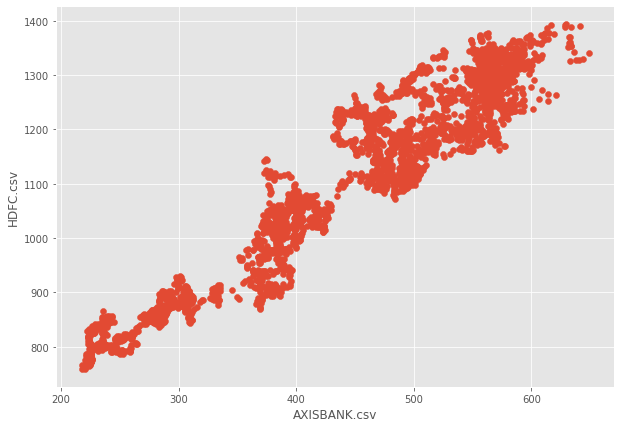

In [8]:
plt.figure(figsize=(10,7))
plt.scatter(X_train,y_train)
plt.xlabel(x_name)
plt.ylabel(y_name)
plt.show()

In [9]:
# training the model and getting the slope 
model = sm.OLS(y_train,X_train)
model = model.fit()
model.params[0]

2.4243012726388877

### Calculate the Spread using Slope
* Formula to calculate spread is `actual - Pred`
* calculating spread for the full data

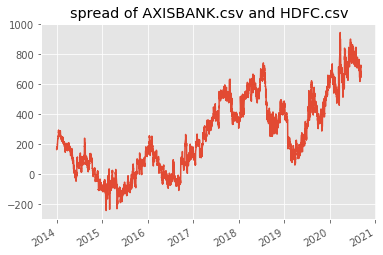

In [10]:
spread = (df.loc["2014":"2020",y_name] - (df.loc["2014":"2020",x_name] * model.params[0]))
spread.name = "spread"
plt.title(f"spread of {x_name} and {y_name}")
spread.plot()
plt.show()

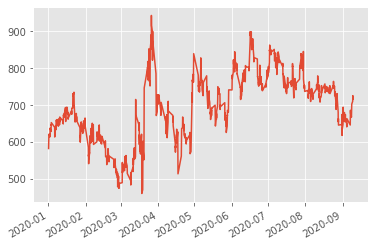

In [11]:
spread.loc["2020"].plot()

### Calculating rolling mean,std on Spread 

In [12]:
spread = bollinger_band(spread,60,2)

# calculating upper band 2 and 3
spread["upper_band2"] = spread.sma + (spread.rolling_std * 2.5)
spread["upper_band3"] = spread.sma + (spread.rolling_std * 3)

# calculating lower band 2 and 3
spread["lower_band2"] = spread.sma - (spread.rolling_std * 2.5)
spread["lower_band3"] = spread.sma - (spread.rolling_std * 3)

In [13]:
spread[['spread', 'sma','upper_band', 'lower_band',
       'upper_band2', 'upper_band3', 'lower_band2',
       'lower_band3']].iplot()
plt.show()

### Getting the rolling adf value of the spread 
* getting rolling adf values of the spread lets us now in real time if based on past n values series acted stationary or not
* if series acted stationary then only we will go ahead and look for trade 
* if not we will not look to trade until sereis again starts showing attributes of stationarity 

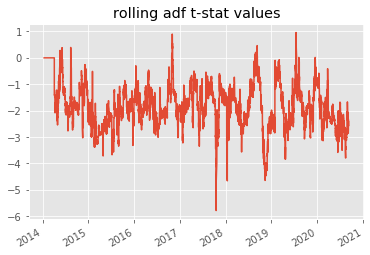

In [14]:
spread["rolling_adf"] = rolling_adf(spread.spread,rolling_n=400)

spread.rolling_adf.plot()
plt.title("rolling adf t-stat values")
plt.show()

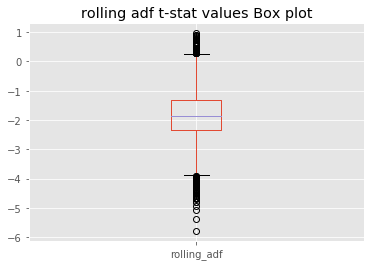

In [15]:
spread["rolling_adf"].plot(kind = "box")
plt.title("rolling adf t-stat values Box plot")
plt.show()

### Run mean reversion backtest on the spread

Look to trade if adf is below stationary thresh hold

stratergy rules for short

* if the spread goes `above +2std` and `below +2.5std` take short trade
* And once short trade is taken `target is mean` and `stop is +3 std` 

stratergy rules for long 
* if the spread is `below -2std` and `greater than -2.5std` we take a long trade 
* once the long trade is taken `target is mean` and `stop is -3 std` 

In [16]:
spread.head()

,spread,sma,rolling_std,upper_band,lower_band,width,upper_band2,upper_band3,lower_band2,lower_band3,rolling_adf
2014-01-13 12:00:00,242.348362,199.554031,26.055524,251.665079,147.442983,104.222096,264.692841,277.720603,134.415221,121.387459,0.0
2014-01-13 13:00:00,241.987668,200.758903,26.321513,253.401929,148.115877,105.286052,266.562685,279.723442,134.955120,121.794364,0.0
2014-01-13 14:00:00,246.161949,202.051073,26.618968,255.289010,148.813137,106.475872,268.598494,281.907978,135.503653,122.194169,0.0
2014-01-13 15:00:00,242.040482,203.355714,26.628829,256.613371,150.098057,106.515314,269.927785,283.242200,136.783642,123.469228,0.0
2014-01-14 09:00:00,250.052710,204.780230,26.805011,258.390253,151.170208,107.220045,271.792758,285.195264,137.767702,124.365197,0.0


In [17]:
# running mean reversion stratergy only on unseen data 
sample  = spread.loc["2016":].copy()

# constant variables 
thresh = -2.8

entry_time = []
exit_time = []

trade_side = []
adf_value = []

entry_price = []
exit_price = []

target_price = []
stop_price = []


# temp variables
trade_taken = False
target = 0
stop = 0

for index,datetime in enumerate(sample.index):
    
    
    # current data variables 
    current_datetime = datetime
    current_spread = sample.iloc[index].loc["spread"]
    sma = sample.iloc[index].loc["sma"]
    adf = sample.iloc[index].loc["rolling_adf"]
    
    upper_band = sample.iloc[index].loc["upper_band"]
    upper_band2 = sample.iloc[index].loc["upper_band2"]
    upper_band3 = sample.iloc[index].loc["upper_band3"]
    
    lower_band = sample.iloc[index].loc["lower_band"]
    lower_band2 = sample.iloc[index].loc["lower_band2"]
    lower_band3 = sample.iloc[index].loc["lower_band3"]
    
    print("index:",index)
    print("current_spread:",current_spread)
    print("sma:",sma)
    print("adf_value:",adf)
    print("upper_band:",upper_band)
    print("upper_band2:",upper_band2)
    print("upper_band3:",upper_band3)
    print("lower_band:",lower_band)
    print("lower_band2:",lower_band2)
    print("lower_band3:",lower_band3)
    print()
    
    
    # stratergy logic below 
    
    # if any trade is not taken and adf value not below a desired thresh dont look for new trades 
    if (adf > thresh) and (trade_taken == False):
        continue
        
        
    # cheking for fresh short trade stop
    elif ((current_spread >= upper_band) and (current_spread <= upper_band2)) and (trade_taken == False):
        
        trade_taken = "short_entered"
        target = sma
        stop = upper_band3
        
        # appending trade details
        entry_time.append(current_datetime)
        adf_value.append(adf)
        trade_side.append("short")
        entry_price.append(current_spread)
        target_price.append(target)
        stop_price.append(stop)
        
       
    
    # cheking for short trade stop
    elif (trade_taken == "short_entered") and (current_spread > stop):
        
        trade_taken = False
        
        # appending trade details
        exit_time.append(current_datetime)
        exit_price.append(current_spread)
        
        
    # cheking for short trade target 
    elif (trade_taken == "short_entered") and (current_spread < target):
        
        trade_taken = False
        
        # appending trade details
        exit_time.append(current_datetime)
        exit_price.append(current_spread)
        
        
    # cheking for fresh long trade 
    elif ((current_spread < lower_band) and (current_spread > lower_band2)) and (trade_taken == False):
        
        trade_taken = "long_entered"
        target = sma
        stop = lower_band3
        
        # appending trade details
        entry_time.append(current_datetime)
        adf_value.append(adf)
        trade_side.append("long")
        entry_price.append(current_spread)
        target_price.append(target)
        stop_price.append(stop)
        
        
    # checking for long trade stop 
    elif (trade_taken == "long_entered") and (current_spread < stop):
        
        trade_taken = False
        
        # appending trade details
        exit_time.append(current_datetime)
        exit_price.append(current_spread)
        
        
    # checking for long trade target 
    elif (trade_taken == "long_entered") and (current_spread > target):
        
        trade_taken = False
        
        # appending trade details
        exit_time.append(current_datetime)
        exit_price.append(current_spread)
        
    
       
        
    # if last data entry and we are still holding a trade then sqaure off the trade 
    elif (index == (len(sample) - 1)) and (trade_taken != False):
        
        trade_taken = False
        
    
        # appending trade details
        exit_time.append(current_datetime)
        exit_price.append(current_spread)
        

index: 0
current_spread: 162.33713693070877
sma: 144.1365520555257
adf_value: -1.699144180523818
upper_band: 175.86921935902555
upper_band2: 183.8023861849005
upper_band3: 191.73555301077545
lower_band: 112.40388475202586
lower_band2: 104.4707179261509
lower_band3: 96.53755110027593

index: 1
current_spread: 165.00386833061157
sma: 143.9365391088785
adf_value: -1.751345280904926
upper_band: 174.9700640154274
upper_band2: 182.7284452420646
upper_band3: 190.48682646870185
lower_band: 112.9030142023296
lower_band2: 105.14463297569237
lower_band3: 97.38625174905515

index: 2
current_spread: 170.7160189669312
sma: 143.799125799203
adf_value: -1.7569501185409364
upper_band: 174.26970913607167
upper_band2: 181.8873549702888
upper_band3: 189.50500080450598
lower_band: 113.32854246233435
lower_band2: 105.7108966281172
lower_band3: 98.09325079390004

index: 3
current_spread: 172.12518049409778
sma: 143.7309040654372
adf_value: -1.6778458876868896
upper_band: 173.92328600225255
upper_band2: 181.4

lower_band3: 112.87960083937946

index: 73
current_spread: 220.59989115247947
sma: 174.5980833228838
adf_value: -0.9428265916771096
upper_band: 216.45414304780928
upper_band2: 226.91815797904064
upper_band3: 237.382172910272
lower_band: 132.74202359795834
lower_band2: 122.27800866672699
lower_band3: 111.81399373549561

index: 74
current_spread: 227.22737573397967
sma: 175.54634227826043
adf_value: -0.8223860295939167
upper_band: 219.53297620558627
upper_band2: 230.52963468741774
upper_band3: 241.5262931692492
lower_band: 131.55970835093459
lower_band2: 120.56304986910312
lower_band3: 109.56639138727166

index: 75
current_spread: 256.72964708738914
sma: 176.94107509968381
adf_value: -0.7319350843100128
upper_band: 225.65776722466586
upper_band2: 237.83694025591137
upper_band3: 250.01611328715686
lower_band: 128.22438297470177
lower_band2: 116.04520994345627
lower_band3: 103.86603691221077

index: 76
current_spread: 244.09927049659063
sma: 178.27785308141065
adf_value: -0.300765871271386

sma: 173.50086631154915
adf_value: -1.338930940623691
upper_band: 229.1692359793103
upper_band2: 243.08632839625056
upper_band3: 257.00342081319087
lower_band: 117.832496643788
lower_band2: 103.91540422684773
lower_band3: 89.99831180990743

index: 141
current_spread: 207.9990172537922
sma: 173.44551821642742
adf_value: -1.233081834210651
upper_band: 228.9673434912561
upper_band2: 242.84779980996325
upper_band3: 256.7282561286704
lower_band: 117.92369294159876
lower_band2: 104.0432366228916
lower_band3: 90.16278030418442

index: 142
current_spread: 215.226404735438
sma: 173.2456184876786
adf_value: -1.1175571729172709
upper_band: 228.06175873835713
upper_band2: 241.76579380102675
upper_band3: 255.4698288636964
lower_band: 118.42947823700007
lower_band2: 104.72544317433044
lower_band3: 91.0214081116608

index: 143
current_spread: 225.22650183529208
sma: 173.31574528650359
adf_value: -1.0110774377759295
upper_band: 228.39065113212433
upper_band2: 242.15937759352948
upper_band3: 255.928104

upper_band: 265.6138053978238
upper_band2: 291.8978406988926
upper_band3: 318.18187599996145
lower_band: 55.34152298927336
lower_band2: 29.05748768820456
lower_band3: 2.773452387135734

index: 223
current_spread: 93.36854356313938
sma: 157.997312861765
adf_value: -1.753962079943142
upper_band: 262.310525045486
upper_band2: 288.38882809141626
upper_band3: 314.4671311373465
lower_band: 53.68410067804403
lower_band2: 27.60579763211379
lower_band3: 1.5274945861835363

index: 224
current_spread: 95.7946306899172
sma: 155.5406814486061
adf_value: -1.8124622383362345
upper_band: 258.62768792193174
upper_band2: 284.39943954026313
upper_band3: 310.1711911585945
lower_band: 52.45367497528049
lower_band2: 26.681923356949085
lower_band3: 0.9101717386176915

index: 225
current_spread: 90.84443649020875
sma: 152.94368997772972
adf_value: -1.7338056869534446
upper_band: 254.53266829017028
upper_band2: 279.92991286828044
upper_band3: 305.3271574463906
lower_band: 51.35471166528916
lower_band2: 25.9574

lower_band3: 70.48630800350875

index: 298
current_spread: 108.45779038154205
sma: 109.87922599503062
adf_value: -2.22319515682645
upper_band: 135.60896404298524
upper_band2: 142.04139855497385
upper_band3: 148.47383306696253
lower_band: 84.14948794707603
lower_band2: 77.71705343508738
lower_band3: 71.28461892309872

index: 299
current_spread: 109.22293012701437
sma: 109.98216626974904
adf_value: -2.198009663344249
upper_band: 135.65005217296826
upper_band2: 142.06702364877307
upper_band3: 148.48399512457786
lower_band: 84.31428036652983
lower_band2: 77.89730889072501
lower_band3: 71.48033741492021

index: 300
current_spread: 116.3093820359727
sma: 110.26735421537623
adf_value: -2.1778780214139912
upper_band: 135.82785495034895
upper_band2: 142.21798013409213
upper_band3: 148.60810531783534
lower_band: 84.70685348040351
lower_band2: 78.31672829666033
lower_band3: 71.92660311291714

index: 301
current_spread: 128.83657531791005
sma: 110.70473677676453
adf_value: -2.2226927747447163
uppe


index: 371
current_spread: 61.82914060179223
sma: 120.21359981313218
adf_value: -1.8070392684438996
upper_band: 174.52646683390856
upper_band2: 188.10468358910265
upper_band3: 201.68290034429674
lower_band: 65.9007327923558
lower_band2: 52.322516037161705
lower_band3: 38.7442992819676

index: 372
current_spread: 67.94428034726434
sma: 119.30759598603946
adf_value: -1.716439621112791
upper_band: 175.26720627247306
upper_band2: 189.25710884408147
upper_band3: 203.24701141568988
lower_band: 63.34798569960584
lower_band2: 49.35808312799743
lower_band3: 35.368180556389035

index: 373
current_spread: 70.12316238348649
sma: 118.49899414030591
adf_value: -1.7947941803951213
upper_band: 175.88187819561873
upper_band2: 190.22759920944694
upper_band3: 204.57332022327512
lower_band: 61.116110084993096
lower_band2: 46.770389071164885
lower_band3: 32.42466805733669

index: 374
current_spread: 67.20942009273654
sma: 117.61299354987501
adf_value: -1.8073246604688449
upper_band: 176.50027677284834
upp

lower_band3: -41.823764719310624

index: 444
current_spread: 42.6742685386464
sma: 58.93029622566578
adf_value: -1.2690021114462022
upper_band: 126.47576693590361
upper_band2: 143.36213461346307
upper_band3: 160.24850229102253
lower_band: -8.615174484572059
lower_band2: -25.50154216213152
lower_band3: -42.38790983969097

index: 445
current_spread: 53.810914647312984
sma: 58.70278264473916
adf_value: -1.3351460561722805
upper_band: 126.22331487256831
upper_band2: 143.1034479295256
upper_band3: 159.98358098648288
lower_band: -8.817749583089991
lower_band2: -25.697882640047283
lower_band3: -42.57801569700456

index: 446
current_spread: 50.94408614755616
sma: 58.510773721994944
adf_value: -1.4370334885365779
upper_band: 126.05330892581193
upper_band2: 142.9389427267662
upper_band3: 159.82457652772044
lower_band: -9.031761481822052
lower_band2: -25.917395282776305
lower_band3: -42.80302908373054

index: 447
current_spread: 54.69726945641719
sma: 58.372124660157915
adf_value: -1.401604569106

lower_band2: -19.449607934249734
lower_band3: -29.716987288013968

index: 518
current_spread: -32.98394297630489
sma: 30.84878726008901
adf_value: -0.6383764103206434
upper_band: 75.20169460856553
upper_band2: 86.28992144568467
upper_band3: 97.3781482828038
lower_band: -13.504120088387516
lower_band2: -24.592346925506646
lower_band3: -35.680573762625784

index: 519
current_spread: -20.27309269485363
sma: 29.986324766207066
adf_value: -0.5157313160028176
upper_band: 76.26062495902744
upper_band2: 87.82920000723253
upper_band3: 99.39777505543762
lower_band: -16.287975426613304
lower_band2: -27.856550474818395
lower_band3: -39.425125523023496

index: 520
current_spread: -12.547102667929948
sma: 29.22323144959711
adf_value: -0.7425887311140112
upper_band: 76.77189505360657
upper_band2: 88.65906095460893
upper_band3: 100.5462268556113
lower_band: -18.325432154412344
lower_band2: -30.212598055414706
lower_band3: -42.09976395641708

index: 521
current_spread: -16.06682317698551
sma: 28.346753

upper_band3: 134.34307751589915
lower_band: -90.3261751362327
lower_band2: -112.7931004014459
lower_band3: -135.2600256666591

index: 600
current_spread: 36.057710352125696
sma: 0.38579933586148246
adf_value: -1.8945625762339022
upper_band: 90.66398429650899
upper_band2: 113.23353053667087
upper_band3: 135.80307677683274
lower_band: -89.89238562478603
lower_band2: -112.46193186494791
lower_band3: -135.03147810510976

index: 601
current_spread: 35.61219401585481
sma: 1.39019729331762
adf_value: -1.8451587668783715
upper_band: 91.87597366421272
upper_band2: 114.4974177569365
upper_band3: 137.11886184966025
lower_band: -89.09557907757747
lower_band2: -111.71702317030125
lower_band3: -134.33846726302502

index: 602
current_spread: 3.290493452951978
sma: 1.8795871591192432
adf_value: -1.87380308716368
upper_band: 92.07832678692405
upper_band2: 114.62801169387525
upper_band3: 137.17769660082647
lower_band: -88.31915246868557
lower_band2: -110.86883737563677
lower_band3: -133.418522282588

in

lower_band3: -39.13412696888669

index: 673
current_spread: -3.9187651740689944
sma: -8.605339115572168
adf_value: -1.5336585176858022
upper_band: 11.744599589664723
upper_band2: 16.832084265973947
upper_band3: 21.919568942283167
lower_band: -28.95527782080906
lower_band2: -34.04276249711828
lower_band3: -39.130247173427506

index: 674
current_spread: -1.8869911285480612
sma: -8.632847207226678
adf_value: -1.5542724667366208
upper_band: 11.675493739831296
upper_band2: 16.75257897659579
upper_band3: 21.829664213360285
lower_band: -28.941188154284653
lower_band2: -34.01827339104915
lower_band3: -39.09535862781364

index: 675
current_spread: -3.61876517406904
sma: -8.722500096156425
adf_value: -1.5854034309461893
upper_band: 11.446216248911762
upper_band2: 16.488395335178808
upper_band3: 21.530574421445856
lower_band: -28.891216441224614
lower_band2: -33.93339552749166
lower_band3: -38.9755746137587

index: 676
current_spread: -8.177926701235492
sma: -8.725715356598672
adf_value: -1.51685

upper_band: 15.822323065326373
upper_band2: 25.863577918558292
upper_band3: 35.904832771790204
lower_band: -64.50771576052897
lower_band2: -74.54897061376089
lower_band3: -84.59022546699279

index: 738
current_spread: -41.787535670909165
sma: -24.867273874522827
adf_value: -2.5546218592667573
upper_band: 15.374453740837208
upper_band2: 25.43488564467722
upper_band3: 35.49531754851722
lower_band: -65.10900148988286
lower_band2: -75.16943339372287
lower_band3: -85.22986529756288

index: 739
current_spread: -43.64968630722865
sma: -25.37399781705049
adf_value: -2.6055818438674976
upper_band: 15.037802043586215
upper_band2: 25.14075200874539
upper_band3: 35.243701973904564
lower_band: -65.7857976776872
lower_band2: -75.88874764284637
lower_band3: -85.99169760800555

index: 740
current_spread: -42.308653634686834
sma: -25.770618885944586
adf_value: -2.6160515179432275
upper_band: 14.8338592891213
upper_band2: 24.98497883288777
upper_band3: 35.136098376654246
lower_band: -66.37509706101048
l

lower_band3: -131.48830975659462

index: 823
current_spread: -14.494134545103407
sma: -54.33648169900631
adf_value: -2.0875388290033183
upper_band: -2.3041686908160557
upper_band2: 10.703909561231512
upper_band3: 23.711987813279066
lower_band: -106.36879470719657
lower_band2: -119.37687295924414
lower_band3: -132.3849512112917

index: 824
current_spread: -29.90069536253418
sma: -53.839056426735134
adf_value: -2.0914667940619
upper_band: -1.4477127785550294
upper_band2: 11.650123133489991
upper_band3: 24.74795904553502
lower_band: -106.23040007491524
lower_band2: -119.32823598696027
lower_band3: -132.42607189900528

index: 825
current_spread: -30.65218991711049
sma: -53.190344599765
adf_value: -2.11938336470968
upper_band: -0.6279719559383707
upper_band2: 12.512621205018291
upper_band3: 25.653214365974947
lower_band: -105.75271724359163
lower_band2: -118.89331040454829
lower_band3: -132.03390356550494

index: 826
current_spread: -2.438485683124327
sma: -52.10521583283698
adf_value: -2.0

upper_band: -1.4146305513779254
upper_band2: 7.855224364395291
upper_band3: 17.1250792801685
lower_band: -75.57346987756364
lower_band2: -84.84332479333685
lower_band3: -94.11317970911006

index: 894
current_spread: -37.69727979720096
sma: -38.716883110335026
adf_value: -2.926902226720604
upper_band: -1.8235521890323199
upper_band2: 7.39978054129336
upper_band3: 16.623113271619033
lower_band: -75.61021403163772
lower_band2: -84.83354676196342
lower_band3: -94.05687949228908

index: 895
current_spread: -37.859430433520174
sma: -38.946053997715005
adf_value: -2.906081241321588
upper_band: -2.251540921958963
upper_band2: 6.9220873469800495
upper_band3: 16.095715615919055
lower_band: -75.64056707347105
lower_band2: -84.81419534241006
lower_band3: -93.98782361134906

index: 896
current_spread: -23.858130078652266
sma: -38.957450883422645
adf_value: -2.961072740246266
upper_band: -2.282444393346431
upper_band2: 6.886307229172623
upper_band3: 16.055058851691676
lower_band: -75.63245737349885


sma: -8.33266086977178
adf_value: -1.296612093504475
upper_band: 64.18090358452785
upper_band2: 82.30929469810276
upper_band3: 100.43768581167768
lower_band: -80.84622532407143
lower_band2: -98.97461643764633
lower_band3: -117.10300755122125

index: 970
current_spread: 85.0093781200842
sma: -6.5801149222271045
adf_value: -1.306013476573192
upper_band: 69.75441170358451
upper_band2: 88.83804336003742
upper_band3: 107.92167501649031
lower_band: -82.91464154803873
lower_band2: -101.99827320449164
lower_band3: -121.08190486094453

index: 971
current_spread: 75.45470025664645
sma: -4.911207692254648
adf_value: -1.3955017302013786
upper_band: 74.14365802951379
upper_band2: 93.9073744599559
upper_band3: 113.671090890398
lower_band: -83.96607341402309
lower_band2: -103.7297898444652
lower_band3: -123.4935062749073

index: 972
current_spread: 77.48348519301453
sma: -3.362708720154649
adf_value: -1.5490599522110167
upper_band: 78.44612303162386
upper_band2: 98.89833096956848
upper_band3: 119.350

adf_value: -2.250783648251133
upper_band: 85.62828216184539
upper_band2: 103.22120600763053
upper_band3: 120.81412985341565
lower_band: -55.115108604435676
lower_band2: -72.70803245022081
lower_band3: -90.30095629600594

index: 1043
current_spread: -36.047435940145306
sma: 13.840803898136796
adf_value: -2.2581928542250846
upper_band: 84.87413432899812
upper_band2: 102.63246693671346
upper_band3: 120.39079954442879
lower_band: -57.19252653272453
lower_band2: -74.95085914043986
lower_band3: -92.70919174815519

index: 1044
current_spread: -34.01098403118681
sma: 12.508078730898834
adf_value: -2.238613614210742
upper_band: 84.0890810882745
upper_band2: 101.98433167761841
upper_band3: 119.87958226696233
lower_band: -59.072923626476836
lower_band2: -76.96817421582075
lower_band3: -94.86342480516467

index: 1045
current_spread: -39.60032794944391
sma: 11.072576325326729
adf_value: -2.23814655144138
upper_band: 83.32955927897243
upper_band2: 101.39380501738387
upper_band3: 119.45805075579528
l

sma: -51.77721792232679
adf_value: -2.13737736212152
upper_band: -23.236583248113913
upper_band2: -16.101424579560693
upper_band3: -8.966265911007476
lower_band: -80.31785259653967
lower_band2: -87.4530112650929
lower_band3: -94.5881699336461

index: 1121
current_spread: -41.881675538784066
sma: -51.74670615654137
adf_value: -2.07013102945169
upper_band: -23.16711195291449
upper_band2: -16.022213402007772
upper_band3: -8.877314851101048
lower_band: -80.32630036016826
lower_band2: -87.47119891107496
lower_band3: -94.6160974619817

index: 1122
current_spread: -42.72410566604799
sma: -51.925058909845546
adf_value: -2.100964120012057
upper_band: -23.714985488641204
upper_band2: -16.662467133340115
upper_band3: -9.609948778039033
lower_band: -80.13513233104989
lower_band2: -87.18765068635098
lower_band3: -94.24016904165205

index: 1123
current_spread: -43.5741056660479
sma: -52.07176990572599
adf_value: -2.1338302920681365
upper_band: -24.134343322829785
upper_band2: -17.149986677105737
upp

adf_value: -1.9847737217990042
upper_band: 2.666356285150428
upper_band2: 17.353422440373883
upper_band3: 32.04048859559733
lower_band: -114.83017295663717
lower_band2: -129.51723911186062
lower_band3: -144.20430526708407

index: 1194
current_spread: -88.86968104540892
sma: -56.27996055980135
adf_value: -1.9622049971462268
upper_band: 2.8339598552871053
upper_band2: 17.612439959059216
upper_band3: 32.39092006283134
lower_band: -115.39388097488981
lower_band2: -130.17236107866194
lower_band3: -144.95084118243403

index: 1195
current_spread: -77.00883076395758
sma: -56.47897066340737
adf_value: -1.9120187390021652
upper_band: 2.8353578314004935
upper_band2: 17.663939955102464
upper_band3: 32.49252207880443
lower_band: -115.79329915821523
lower_band2: -130.62188128191718
lower_band3: -145.45046340561916

index: 1196
current_spread: -75.68911025490206
sma: -56.811973068979476
adf_value: -2.042656587980387
upper_band: 2.708756378178272
upper_band2: 17.58893873996771
upper_band3: 32.46912110

lower_band2: -129.46671637855
lower_band3: -148.89932022952638

index: 1262
current_spread: 69.81607409413255
sma: -30.528226734941885
adf_value: -1.6131939536763378
upper_band: 51.53815124841137
upper_band2: 72.05474574424969
upper_band3: 92.57134024008799
lower_band: -112.59460471829513
lower_band2: -133.11119921413345
lower_band3: -153.62779370997177

index: 1263
current_spread: 67.12354686701451
sma: -28.80318789500022
adf_value: -1.602183686496961
upper_band: 57.02783556018048
upper_band2: 78.48559142397565
upper_band3: 99.94334728777083
lower_band: -114.63421135018092
lower_band2: -136.0919672139761
lower_band3: -157.54972307777126

index: 1264
current_spread: 75.45103144851464
sma: -26.486500824311214
adf_value: -1.6751490937709732
upper_band: 62.957087391726695
upper_band2: 85.31798444573619
upper_band3: 107.67888149974564
lower_band: -115.93008904034912
lower_band2: -138.2909860943586
lower_band3: -160.65188314836806

index: 1265
current_spread: 82.99346157577861
sma: -24.0496

lower_band: 62.42162274328833
lower_band2: 52.627812469207115
lower_band3: 42.83400219512589

index: 1343
current_spread: 81.19680102758412
sma: 101.19494744623775
adf_value: -1.1796915007674111
upper_band: 140.7085044972157
upper_band2: 150.58689375996016
upper_band3: 160.46528302270468
lower_band: 61.681390395259804
lower_band2: 51.80300113251532
lower_band3: 41.92461186977083

index: 1344
current_spread: 66.308660364341
sma: 100.35851629107384
adf_value: -1.1578550416466837
upper_band: 140.67126512618398
upper_band2: 150.74945233496152
upper_band3: 160.82763954373905
lower_band: 60.045767455963706
lower_band2: 49.96758024718617
lower_band3: 39.88939303840864

index: 1345
current_spread: 67.44819848230622
sma: 99.61994357529653
adf_value: -1.2408554518563706
upper_band: 140.69927463396425
upper_band2: 150.96910739863117
upper_band3: 161.23894016329808
lower_band: 58.54061251662882
lower_band2: 48.27077975196189
lower_band3: 38.00094698729497

index: 1346
current_spread: 68.9876395004

lower_band: -14.513130125231655
lower_band2: -39.77293167082867
lower_band3: -65.03273321642568

index: 1415
current_spread: 194.32116134331295
sma: 89.25631093437978
adf_value: -0.04786174166935548
upper_band: 192.95600374781293
upper_band2: 218.8809269511712
upper_band3: 244.80585015452948
lower_band: -14.443381879053362
lower_band2: -40.36830508241165
lower_band3: -66.29322828576993

index: 1416
current_spread: 189.54686007067426
sma: 91.67552840358384
adf_value: -0.008806421374591976
upper_band: 197.86065022197806
upper_band2: 224.40693067657662
upper_band3: 250.95321113117518
lower_band: -14.509593414810382
lower_band2: -41.05587386940893
lower_band3: -67.60215432400749

index: 1417
current_spread: 195.377333761327
sma: 94.20285664126565
adf_value: -0.06459473864323927
upper_band: 202.93457791692265
upper_band2: 230.1175082358369
upper_band3: 257.30043855475117
lower_band: -14.52886463439134
lower_band2: -41.711794953305585
lower_band3: -68.89472527221984

index: 1418
current_spre

upper_band: 311.5346666271696
upper_band2: 339.2470865668412
upper_band3: 366.95950650651264
lower_band: 89.83530710979737
lower_band2: 62.122887170125836
lower_band3: 34.410467230454316

index: 1480
current_spread: 69.32356785334082
sma: 198.31858449350372
adf_value: -1.329467552082552
upper_band: 314.1939846124893
upper_band2: 343.1628346422357
upper_band3: 372.13168467198216
lower_band: 82.44318437451813
lower_band2: 53.474334344771734
lower_band3: 24.505484315025313

index: 1481
current_spread: 68.36450342602848
sma: 195.53773174019955
adf_value: -1.3540592024056637
upper_band: 315.73884232742796
upper_band2: 345.78911997423506
upper_band3: 375.8393976210422
lower_band: 75.3366211529711
lower_band2: 45.286343506164
lower_band3: 15.23606585935687

index: 1482
current_spread: 65.96898708975755
sma: 192.5046296976557
adf_value: -1.3149098269746866
upper_band: 316.45131688472264
upper_band2: 347.4379886814894
upper_band3: 378.4246604782561
lower_band: 68.55794251058876
lower_band2: 37.

lower_band: 55.43944923492777
lower_band2: 45.712353109443924
lower_band3: 35.98525698396007

index: 1558
current_spread: 138.40887555037534
sma: 95.31570026790426
adf_value: -1.4480900053835781
upper_band: 135.66866241252987
upper_band2: 145.75690294868627
upper_band3: 155.84514348484265
lower_band: 54.96273812327866
lower_band2: 44.874497587122264
lower_band3: 34.78625705096586

index: 1559
current_spread: 134.88606883231296
sma: 96.10270531970727
adf_value: -1.433394316858807
upper_band: 137.6723021561892
upper_band2: 148.06470136530967
upper_band3: 158.45710057443017
lower_band: 54.53310848322534
lower_band2: 44.14070927410486
lower_band3: 33.74831006498438

index: 1560
current_spread: 129.34841366834075
sma: 96.55706415271446
adf_value: -1.3814734553943975
upper_band: 138.97990984302288
upper_band2: 149.5856212656
upper_band3: 160.1913326881771
lower_band: 54.134218462406025
lower_band2: 43.528507039828916
lower_band3: 32.92279561725181

index: 1561
current_spread: 127.13476847744

upper_band2: 229.11028384205832
upper_band3: 244.3096888135359
lower_band: 92.31563909876019
lower_band2: 77.11623412728261
lower_band3: 61.91682915580505

index: 1628
current_spread: 186.13733113041712
sma: 153.9606538584266
adf_value: -2.3475447683002755
upper_band: 215.16392002848818
upper_band2: 230.46473657100356
upper_band3: 245.76555311351893
lower_band: 92.75738768836506
lower_band2: 77.45657114584967
lower_band3: 62.15575460333429

index: 1629
current_spread: 184.24162059443802
sma: 154.63367631824894
adf_value: -2.337282733686007
upper_band: 216.2717003519434
upper_band2: 231.681206360367
upper_band3: 247.0907123687906
lower_band: 92.9956522845545
lower_band2: 77.58614627613089
lower_band3: 62.176640267707285

index: 1630
current_spread: 180.46273855821573
sma: 155.23315969747082
adf_value: -2.2880881702684084
upper_band: 217.16895906754243
upper_band2: 232.65290891006032
upper_band3: 248.13685875257823
lower_band: 93.29736032739922
lower_band2: 77.81341048488133
lower_band3:

index: 1707
current_spread: 171.45903169331996
sma: 143.15875764983105
adf_value: -1.861360009862882
upper_band: 184.4824349602444
upper_band2: 194.81335428784774
upper_band3: 205.14427361545108
lower_band: 101.83508033941769
lower_band2: 91.50416101181435
lower_band3: 81.17324168421099

index: 1708
current_spread: 164.47238558465347
sma: 143.75287710039427
adf_value: -1.8529433323720081
upper_band: 185.2628715984025
upper_band2: 195.64037022290458
upper_band3: 206.01786884740665
lower_band: 102.24288260238603
lower_band2: 91.86538397788397
lower_band3: 81.48788535338191

index: 1709
current_spread: 174.37089103007702
sma: 144.37921607596152
adf_value: -1.8796393003307985
upper_band: 186.5900472989714
upper_band2: 197.14275510472385
upper_band3: 207.69546291047632
lower_band: 102.16838485295166
lower_band2: 91.6156770471992
lower_band3: 81.06296924144672

index: 1710
current_spread: 178.31650446620188
sma: 145.04535577758526
adf_value: -1.8371810221277227
upper_band: 188.1216510763112


adf_value: -2.407868578141922
upper_band: 142.12497705105167
upper_band2: 147.76217350556476
upper_band3: 153.39936996007785
lower_band: 97.0274054149469
lower_band2: 91.3902089604338
lower_band3: 85.75301250592071

index: 1784
current_spread: 115.80347993119494
sma: 119.08231700392429
adf_value: -2.416552835631197
upper_band: 140.60168401413856
upper_band2: 145.98152576669213
upper_band3: 151.36136751924568
lower_band: 97.56294999371002
lower_band2: 92.18310824115645
lower_band3: 86.80326648860289

index: 1785
current_spread: 130.7549744857713
sma: 118.93596768409223
adf_value: -2.3881878921154
upper_band: 140.00420543588947
upper_band2: 145.2712648738388
upper_band3: 150.5383243117881
lower_band: 97.86772993229499
lower_band2: 92.60067049434568
lower_band3: 87.33361105639636

index: 1786
current_spread: 118.51365051366724
sma: 118.53963680017951
adf_value: -2.4060464559356487
upper_band: 138.6954218535206
upper_band2: 143.73436811685588
upper_band3: 148.77331438019115
lower_band: 98.

lower_band3: -28.55687462923811

index: 1862
current_spread: 231.3679399776879
sma: 156.65489619505695
adf_value: -2.162736568684948
upper_band: 277.9508860036628
upper_band2: 308.27488345581423
upper_band3: 338.59888090796574
lower_band: 35.35890638645111
lower_band2: 5.034908934299665
lower_band3: -25.28908851785181

index: 1863
current_spread: 237.06644542311165
sma: 159.56473639533448
adf_value: -1.7472119029993107
upper_band: 280.04426042326816
upper_band2: 310.16414143025156
upper_band3: 340.28402243723497
lower_band: 39.08521236740083
lower_band2: 8.965331360417423
lower_band3: -21.15454964656601

index: 1864
current_spread: 237.49224125032697
sma: 162.51889757272906
adf_value: -1.6276859372201822
upper_band: 281.77793369349865
upper_band2: 311.59269272369113
upper_band3: 341.4074517538835
lower_band: 43.25986145195944
lower_band2: 13.445102421767018
lower_band3: -16.369656608425373

index: 1865
current_spread: 242.6921441504728
sma: 165.40361160846098
adf_value: -1.636301875151

upper_band2: 236.27751186316007
upper_band3: 241.81715819510296
lower_band: 186.42069487567406
lower_band2: 180.88104854373117
lower_band3: 175.34140221178828

index: 1945
current_spread: 213.51667767958384
sma: 208.5230153213278
adf_value: -1.7791253925404602
upper_band: 230.61277056973086
upper_band2: 236.13520938183163
upper_band3: 241.6576481939324
lower_band: 186.43326007292472
lower_band2: 180.91082126082395
lower_band3: 175.38838244872318

index: 1946
current_spread: 210.6939680613757
sma: 208.6061477623867
adf_value: -1.7267612720296985
upper_band: 230.69032094987003
upper_band2: 236.21136424674086
upper_band3: 241.73240754361166
lower_band: 186.5219745749034
lower_band2: 181.00093127803257
lower_band3: 175.47988798116177

index: 1947
current_spread: 203.58032287047968
sma: 208.64430673101944
adf_value: -1.6720454757785022
upper_band: 230.68493165332103
upper_band2: 236.19508788389643
upper_band3: 241.70524411447184
lower_band: 186.60368180871785
lower_band2: 181.09352557814245

upper_band3: 264.18992970245176
lower_band: 92.25600790526477
lower_band2: 75.06261572554607
lower_band3: 57.86922354582737

index: 2018
current_spread: 136.57607146322266
sma: 159.7274606070485
adf_value: -1.7826850844995938
upper_band: 227.3154492396991
upper_band2: 244.21244639786175
upper_band3: 261.1094435560244
lower_band: 92.13947197439789
lower_band2: 75.24247481623524
lower_band3: 58.34547765807258

index: 2019
current_spread: 131.80635095416733
sma: 158.27180874601876
adf_value: -1.7678138623555821
upper_band: 224.40058046330475
upper_band2: 240.93277339262625
upper_band3: 257.4649663219477
lower_band: 92.14303702873278
lower_band2: 75.61084409941128
lower_band3: 59.078651170089785

index: 2020
current_spread: 135.55635095416733
sma: 157.0158265915072
adf_value: -1.7658920212090994
upper_band: 221.9287907889992
upper_band2: 238.15703183837223
upper_band3: 254.38527288774523
lower_band: 92.10286239401516
lower_band2: 75.87462134464215
lower_band3: 59.646380295269154

index: 20

lower_band2: 73.03060286315927
lower_band3: 54.86631351253837

index: 2091
current_spread: 242.2234707534867
sma: 165.84935843397486
adf_value: -1.3377258118258255
upper_band: 240.43266472139538
upper_band2: 259.0784912932505
upper_band3: 277.72431786510566
lower_band: 91.26605214655433
lower_band2: 72.62022557469919
lower_band3: 53.974399002844066

index: 2092
current_spread: 238.38861049895877
sma: 167.70666563335496
adf_value: -1.2568666118060294
upper_band: 243.8827318727526
upper_band2: 262.92674843260204
upper_band3: 281.97076499245145
lower_band: 91.53059939395732
lower_band2: 72.4865828341079
lower_band3: 53.442566274258496

index: 2093
current_spread: 274.56050526157014
sma: 170.14582681074953
adf_value: -1.301373791625341
upper_band: 250.43853272487968
upper_band2: 270.5117092034122
upper_band3: 290.58488568194474
lower_band: 89.85312089661939
lower_band2: 69.77994441808686
lower_band3: 49.70676793955431

index: 2094
current_spread: 274.37116134331313
sma: 172.60231200511262


upper_band: 323.88889102904665
upper_band2: 332.4247528776917
upper_band3: 340.9606147263367
lower_band: 255.60199623988643
lower_band2: 247.0661343912414
lower_band3: 238.53027254259638

index: 2167
current_spread: 263.46102881760476
sma: 289.6436795834384
adf_value: -1.2464991043750495
upper_band: 324.06702168244425
upper_band2: 332.6728572071957
upper_band3: 341.27869273194716
lower_band: 255.2203374844326
lower_band2: 246.61450195968115
lower_band3: 238.0086664349297

index: 2168
current_spread: 254.91700703591027
sma: 289.35269581059595
adf_value: -1.2686078885371503
upper_band: 324.65376938818997
upper_band2: 333.4790377825884
upper_band3: 342.3043061769869
lower_band: 254.05162223300195
lower_band2: 245.22635383860344
lower_band3: 236.40108544420497

index: 2169
current_spread: 260.37925477208387
sma: 289.18747226168887
adf_value: -1.3226536402820313
upper_band: 324.94132299377804
upper_band2: 333.87978567680034
upper_band3: 342.81824835982263
lower_band: 253.4336215295997
lower

adf_value: -0.878530016641235
upper_band: 326.2870883373805
upper_band2: 342.6973349947854
upper_band3: 359.10758165219033
lower_band: 195.00511507814122
lower_band2: 178.5948684207363
lower_band3: 162.18462176333142

index: 2241
current_spread: 309.2240533526117
sma: 261.5904107222822
adf_value: -0.9502852585079304
upper_band: 328.37867742605465
upper_band2: 345.07574410199777
upper_band3: 361.7728107779409
lower_band: 194.8021440185097
lower_band2: 178.10507734256657
lower_band3: 161.40801066662348

index: 2242
current_spread: 298.9587194074311
sma: 262.2318845883289
adf_value: -1.1051503926757018
upper_band: 329.7121350031398
upper_band2: 346.5821976068425
upper_band3: 363.4522602105452
lower_band: 194.75163417351803
lower_band2: 177.88157156981532
lower_band3: 161.01150896611261

index: 2243
current_spread: 307.3544299434102
sma: 262.9808367817945
adf_value: -1.200430771650318
upper_band: 331.45957075623653
upper_band2: 348.57925424984705
upper_band3: 365.6989377434575
lower_band: 

upper_band3: 392.21553260241024
lower_band: 282.04484469870755
lower_band2: 271.0277759083373
lower_band3: 260.01070711796706

index: 2317
current_spread: 284.92876927281304
sma: 325.2566395208183
adf_value: -1.1727170853263724
upper_band: 370.5000084944993
upper_band2: 381.8108507379195
upper_band3: 393.1216929813398
lower_band: 280.01327054713727
lower_band2: 268.70242830371706
lower_band3: 257.3915860602968

index: 2318
current_spread: 289.76064041818813
sma: 324.5134941331122
adf_value: -1.2032315274868224
upper_band: 370.6061409586571
upper_band2: 382.12930266504327
upper_band3: 393.65246437142946
lower_band: 278.4208473075673
lower_band2: 266.89768560118114
lower_band3: 255.37452389479492

index: 2319
current_spread: 281.7378337001255
sma: 324.1210672425101
adf_value: -1.1911945637178845
upper_band: 371.26856090059573
upper_band2: 383.05543431511717
upper_band3: 394.8423077296386
lower_band: 276.97357358442446
lower_band2: 265.186700169903
lower_band3: 253.39982675538158

index: 

upper_band3: 384.3235384876478
lower_band: 285.2050853026059
lower_band2: 275.29323998410166
lower_band3: 265.3813946655975

index: 2392
current_spread: 295.90982556259087
sma: 325.04024803567006
adf_value: -1.8170406514827715
upper_band: 364.01394493486396
upper_band2: 373.7573691596624
upper_band3: 383.5007933844609
lower_band: 286.06655113647616
lower_band2: 276.3231269116777
lower_band3: 266.5797026868792

index: 2393
current_spread: 296.63721304423666
sma: 325.16547967623166
adf_value: -1.8226942110329787
upper_band: 363.7157012013158
upper_band2: 373.3532565825868
upper_band3: 382.9908119638579
lower_band: 286.6152581511475
lower_band2: 276.9777027698765
lower_band3: 267.34014738860543

index: 2394
current_spread: 325.6722674984728
sma: 325.7856382073953
adf_value: -1.8121734467551913
upper_band: 363.1118273909403
upper_band2: 372.44337468682653
upper_band3: 381.7749219827127
lower_band: 288.45944902385037
lower_band2: 279.1279017279641
lower_band3: 269.7963544320779

index: 2395

lower_band3: 302.93026728180695

index: 2474
current_spread: 375.9695106457923
sma: 356.8172835747009
adf_value: -2.4473258006525924
upper_band: 390.0640446424379
upper_band2: 398.3757349093722
upper_band3: 406.6874251763065
lower_band: 323.5705225069639
lower_band2: 315.2588322400296
lower_band3: 306.94714197309537

index: 2475
current_spread: 365.6890369551395
sma: 357.1001740309335
adf_value: -2.5231267469759726
upper_band: 390.35536535039535
upper_band2: 398.66916318026085
upper_band3: 406.9829610101263
lower_band: 323.84498271147163
lower_band2: 315.5311848816061
lower_band3: 307.2173870517407

index: 2476
current_spread: 381.3954035728618
sma: 357.6490537492806
adf_value: -2.630280276676774
upper_band: 391.40763233840937
upper_band2: 399.84727698569156
upper_band3: 408.28692163297376
lower_band: 323.8904751601518
lower_band2: 315.45083051286963
lower_band3: 307.01118586558744

index: 2477
current_spread: 382.4848445909729
sma: 358.1123773726285
adf_value: -2.471137293736729
upper

upper_band: 444.2704954456135
upper_band2: 452.72819338014887
upper_band3: 461.18589131468417
lower_band: 376.60891196933073
lower_band2: 368.1512140347954
lower_band3: 359.69351610026007

index: 2554
current_spread: 425.9278573173617
sma: 410.2375372376157
adf_value: -1.319448891654412
upper_band: 443.537789484669
upper_band2: 451.86285254643235
upper_band3: 460.1879156081957
lower_band: 376.9372849905624
lower_band2: 368.61222192879904
lower_band3: 360.2871588670357

index: 2555
current_spread: 457.68292358021586
sma: 410.5080797516883
adf_value: -1.2772167986413028
upper_band: 445.07935938272107
upper_band2: 453.7221792904793
upper_band3: 462.36499919823746
lower_band: 375.9368001206555
lower_band2: 367.2939802128973
lower_band3: 358.6511603051391

index: 2556
current_spread: 469.0741504524658
sma: 410.8628436059061
adf_value: -0.9451623730081885
upper_band: 447.3728136643303
upper_band2: 456.50030617893634
upper_band3: 465.6277986935424
lower_band: 374.3528735474819
lower_band2: 36

upper_band2: 437.2529434036246
upper_band3: 446.2990398491369
lower_band: 355.83807539401425
lower_band2: 346.791978948502
lower_band3: 337.74588250298973

index: 2627
current_spread: 408.91560958118816
sma: 391.4670664991175
adf_value: -2.1580919826359595
upper_band: 425.4735064913574
upper_band2: 433.9751164894174
upper_band3: 442.4767264874774
lower_band: 357.4606265068776
lower_band2: 348.95901650881757
lower_band3: 340.4574065107576

index: 2628
current_spread: 413.9398137539729
sma: 391.35846950837663
adf_value: -2.2129563455554875
upper_band: 425.0282917310475
upper_band2: 433.4457472867152
upper_band3: 441.8632028423829
lower_band: 357.68864728570577
lower_band2: 349.2711917300381
lower_band3: 340.85373617437034

index: 2629
current_spread: 409.5308464265145
sma: 391.57741522851865
adf_value: -2.19351553525795
upper_band: 425.5499276843289
upper_band2: 434.04305579828144
upper_band3: 442.53618391223404
lower_band: 357.6049027727084
lower_band2: 349.11177465875585
lower_band3: 3

lower_band3: 257.6060746252986

index: 2699
current_spread: 333.29264672018144
sma: 370.200935416346
adf_value: -1.8138422915605066
upper_band: 445.9048777054785
upper_band2: 464.83086327776164
upper_band3: 483.7568488500448
lower_band: 294.4969931272135
lower_band2: 275.57100755493036
lower_band3: 256.6450219826472

index: 2700
current_spread: 331.2472274837646
sma: 368.74449842213795
adf_value: -1.9875106295598077
upper_band: 444.019335913005
upper_band2: 462.8380452857218
upper_band3: 481.65675465843856
lower_band: 293.4696609312709
lower_band2: 274.6509515585541
lower_band3: 255.83224218583734

index: 2701
current_spread: 339.7322819380008
sma: 367.4937967426223
adf_value: -2.062706929855808
upper_band: 442.1487296120856
upper_band2: 460.8124628294514
upper_band3: 479.4761960468172
lower_band: 292.83886387315897
lower_band2: 274.17513065579317
lower_band3: 255.51139743842737

index: 2702
current_spread: 352.2931322194522
sma: 366.4359518841623
adf_value: -2.0878433699744505
upper_b

upper_band: 546.8545065834592
upper_band2: 555.2815009155553
upper_band3: 563.7084952476515
lower_band: 479.4385519266896
lower_band2: 471.01155759459346
lower_band3: 462.5845632624972

index: 2778
current_spread: 552.5847094343546
sma: 513.1714257471614
adf_value: -0.8302318511991138
upper_band: 546.9954120043316
upper_band2: 555.4514085686242
upper_band3: 563.9074051329168
lower_band: 479.34743948999113
lower_band2: 470.8914429256986
lower_band3: 462.43544636140604

index: 2779
current_spread: 560.7591078068479
sma: 513.7078145412145
adf_value: -0.8511995852199182
upper_band: 549.4895879108959
upper_band2: 558.4350312533163
upper_band3: 567.3804745957367
lower_band: 477.926041171533
lower_band2: 468.98059782911264
lower_band3: 460.03515448669225

index: 2780
current_spread: 557.9136885704311
sma: 513.9807920375437
adf_value: -0.8491317197909676
upper_band: 550.8592269121106
upper_band2: 560.0788356307523
upper_band3: 569.298444349394
lower_band: 477.1023571629768
lower_band2: 467.882

upper_band3: 567.7089632042225
lower_band: 512.4714104684476
lower_band2: 506.9476551948701
lower_band3: 501.4238999212926

index: 2847
current_spread: 531.8213935997853
sma: 534.9473402580991
adf_value: -1.0941416140248637
upper_band: 556.0110759183138
upper_band2: 561.2770098333675
upper_band3: 566.5429437484213
lower_band: 513.8836045978843
lower_band2: 508.6176706828306
lower_band3: 503.35173676777686

index: 2848
current_spread: 528.8184044906327
sma: 535.071909343594
adf_value: -1.1106122913098988
upper_band: 555.8954344294741
upper_band2: 561.1013157009442
upper_band3: 566.3071969724141
lower_band: 514.248384257714
lower_band2: 509.04250298624396
lower_band3: 503.8366217147739

index: 2849
current_spread: 535.1320496815283
sma: 535.5212823918072
adf_value: -1.1705011170576645
upper_band: 555.1103487818183
upper_band2: 560.007615379321
upper_band3: 564.9048819768238
lower_band: 515.9322160017961
lower_band2: 511.03494940429334
lower_band3: 506.13768280679056

index: 2850
current_

upper_band: 599.4891713635072
upper_band2: 610.5395067914442
upper_band3: 621.5898422193812
lower_band: 511.086487940011
lower_band2: 500.036152512074
lower_band3: 488.985817084137

index: 2923
current_spread: 572.8496549801187
sma: 555.883624494923
adf_value: -0.7827674338291138
upper_band: 600.0515116009806
upper_band2: 611.093483377495
upper_band3: 622.1354551540094
lower_band: 511.71573738886536
lower_band2: 500.67376561235096
lower_band3: 489.63179383583656

index: 2924
current_spread: 577.9797402713546
sma: 556.545020396579
adf_value: -0.8996111308862172
upper_band: 600.8299222478465
upper_band2: 611.9011477106634
upper_band3: 622.9723731734803
lower_band: 512.2601185453116
lower_band2: 501.1888930824947
lower_band3: 490.11766761967783

index: 2925
current_spread: 573.9402992532437
sma: 557.1472713041496
adf_value: -0.9554789098073624
upper_band: 601.3782934832473
upper_band2: 612.4360490280217
upper_band3: 623.4938045727961
lower_band: 512.916249125052
lower_band2: 501.858493580

adf_value: -1.6677896621819428
upper_band: 564.647635350985
upper_band2: 575.3832802155372
upper_band3: 586.1189250800893
lower_band: 478.76247643456776
lower_band2: 468.0268315700156
lower_band3: 457.2911867054635

index: 2999
current_spread: 497.06073751804206
sma: 521.3667772329215
adf_value: -1.7223206726850409
upper_band: 564.766016108625
upper_band2: 575.6158258275508
upper_band3: 586.4656355464766
lower_band: 477.96753835721813
lower_band2: 467.1177286382923
lower_band3: 456.2679189193665

index: 3000
current_spread: 509.7837384358131
sma: 521.2096638182129
adf_value: -1.7296934811910771
upper_band: 564.7087944595813
upper_band2: 575.5835771199235
upper_band3: 586.4583597802656
lower_band: 477.7105331768444
lower_band2: 466.83575051650234
lower_band3: 455.9609678561602

index: 3001
current_spread: 523.6704816443339
sma: 521.3347812568246
adf_value: -1.7089293450199152
upper_band: 564.8180520291857
upper_band2: 575.688869722276
upper_band3: 586.5596874153662
lower_band: 477.85151

lower_band2: 465.07795774789645
lower_band3: 455.12376869242314

index: 3079
current_spread: 477.9945296741744
sma: 514.1206981090857
adf_value: -2.9751615061781798
upper_band: 555.0124015820035
upper_band2: 565.235327450233
upper_band3: 575.4582533184623
lower_band: 473.22899463616784
lower_band2: 463.0060687679384
lower_band3: 452.783142899709

index: 3080
current_spread: 475.78088448327844
sma: 513.827521338813
adf_value: -2.9319893833768225
upper_band: 555.567794038295
upper_band2: 566.0028622131655
upper_band3: 576.437930388036
lower_band: 472.087248639331
lower_band2: 461.65218046446046
lower_band3: 451.21711228959

index: 3081
current_spread: 476.2717229561117
sma: 513.5916718221707
adf_value: -3.0640077391652762
upper_band: 556.0240766376463
upper_band2: 566.6321778415152
upper_band3: 577.2402790453841
lower_band: 471.1592670066952
lower_band2: 460.5511658028263
lower_band3: 449.9430645989574

index: 3082
current_spread: 480.7777982742716
sma: 513.2485730162886
adf_value: -3.25

lower_band3: 368.96523273850084

index: 3154
current_spread: 416.09852783863244
sma: 545.6730997355932
adf_value: -2.6469648901001173
upper_band: 668.875385825515
upper_band2: 699.6759573479954
upper_band3: 730.4765288704759
lower_band: 422.4708136456713
lower_band2: 391.67024212319086
lower_band3: 360.8696706007104

index: 3155
current_spread: 443.2320877382924
sma: 544.5570942901696
adf_value: -2.4275342717618797
upper_band: 670.2545795244332
upper_band2: 701.6789508329991
upper_band3: 733.1033221415651
lower_band: 418.85960905590605
lower_band2: 387.4352377473401
lower_band3: 356.0108664387742

index: 3156
current_spread: 434.4364743021674
sma: 543.1892413400551
adf_value: -2.8639394131997067
upper_band: 671.8789669668749
upper_band2: 704.0513983735799
upper_band3: 736.2238297802849
lower_band: 414.49951571323527
lower_band2: 382.3270843065303
lower_band3: 350.1546528998253

index: 3157
current_spread: 436.55161404763953
sma: 541.7664365900956
adf_value: -2.643109811042225
upper_ban

lower_band: 278.51197190361245
lower_band2: 248.41575412437714
lower_band3: 218.3195363451418

index: 3237
current_spread: 353.7256240207157
sma: 396.7932492664747
adf_value: -0.8029551344103883
upper_band: 515.8207679335453
upper_band2: 545.577647600313
upper_band3: 575.3345272670806
lower_band: 277.76573059940404
lower_band2: 248.0088509326364
lower_band3: 218.25197126586872

index: 3238
current_spread: 364.92205231243815
sma: 394.67323308316566
adf_value: -0.927215012270724
upper_band: 511.30090509374133
upper_band2: 540.4578230963853
upper_band3: 569.6147410990292
lower_band: 278.04556107259
lower_band2: 248.88864306994603
lower_band3: 219.7317250673021

index: 3239
current_spread: 376.74784813965334
sma: 392.6467760347074
adf_value: -1.0127587550552604
upper_band: 506.1305355925284
upper_band2: 534.5014754819837
upper_band3: 562.8724153714389
lower_band: 279.16301647688636
lower_band2: 250.79207658743113
lower_band3: 222.42113669797587

index: 3240
current_spread: 383.143558675632

upper_band2: 421.5675028851021
upper_band3: 429.90053571072104
lower_band: 346.5702074545318
lower_band2: 338.2371746289129
lower_band3: 329.90414180329395

index: 3307
current_spread: 372.7593781200842
sma: 379.68002121336264
adf_value: -1.4501104958344777
upper_band: 413.0219800575213
upper_band2: 421.357469768561
upper_band3: 429.69295947960063
lower_band: 346.33806236920395
lower_band2: 338.0025726581643
lower_band3: 329.66708294712464

index: 3308
current_spread: 367.77451786555616
sma: 379.5922504483521
adf_value: -1.3678495625889115
upper_band: 413.03288419739044
upper_band2: 421.39304263465004
upper_band3: 429.7532010719096
lower_band: 346.15161669931376
lower_band2: 337.79145826205416
lower_band3: 329.4312998247946

index: 3309
current_spread: 368.08208773829233
sma: 379.55576785637146
adf_value: -1.3799356535921117
upper_band: 413.04251187674095
upper_band2: 421.41419788183333
upper_band3: 429.7858838869257
lower_band: 346.069023836002
lower_band2: 337.6973378309096
lower_ban

index: 3383
current_spread: 390.82991348473684
sma: 383.16865857366327
adf_value: -1.6692524951175547
upper_band: 417.0174145259582
upper_band2: 425.47960351403196
upper_band3: 433.9417925021057
lower_band: 349.3199026213683
lower_band2: 340.85771363329457
lower_band3: 332.3955246452208

index: 3384
current_spread: 387.05860132125053
sma: 383.3208916795939
adf_value: -1.6678805471977527
upper_band: 417.15586585159286
upper_band2: 425.61460939459266
upper_band3: 434.0733529375924
lower_band: 349.48591750759493
lower_band2: 341.02717396459514
lower_band3: 332.5684304215954

index: 3385
current_spread: 376.978224730452
sma: 383.3442851756779
adf_value: -1.6307263025735734
upper_band: 417.15940823386813
upper_band2: 425.6131889984157
upper_band3: 434.06696976296325
lower_band: 349.52916211748766
lower_band2: 341.0753813529401
lower_band3: 332.62160058839254

index: 3386
current_spread: 396.62663307602156
sma: 383.6060618235812
adf_value: -1.7653491901124851
upper_band: 417.5876168671647
up

lower_band3: 305.48458370493756

index: 3463
current_spread: 356.3853091039173
sma: 356.9237570542374
adf_value: -1.4591797276289207
upper_band: 391.2545298340238
upper_band2: 399.8372230289704
upper_band3: 408.419916223917
lower_band: 322.592984274451
lower_band2: 314.0102910795044
lower_band3: 305.42759788455777

index: 3464
current_spread: 355.28530910391737
sma: 356.9977445012108
adf_value: -1.4848534120969599
upper_band: 391.2943536080876
upper_band2: 399.8685058848068
upper_band3: 408.44265816152597
lower_band: 322.70113539433396
lower_band2: 314.12698311761477
lower_band3: 305.5528308408956

index: 3465
current_spread: 353.5429760765078
sma: 357.1453939566684
adf_value: -1.4835171564411405
upper_band: 391.3023555861052
upper_band2: 399.84159599346435
upper_band3: 408.38083640082357
lower_band: 322.9884323272316
lower_band2: 314.4491919198724
lower_band3: 305.9099515125132

index: 3466
current_spread: 338.981931595348
sma: 356.6057080668412
adf_value: -1.4699078606419242
upper_ba

lower_band2: 276.748584342748
lower_band3: 257.0627890951971

index: 3523
current_spread: 517.4699751587366
sma: 377.86230501474944
adf_value: -2.170138939278312
upper_band: 464.57973724229015
upper_band2: 486.2590952991753
upper_band3: 507.9384533560605
lower_band: 291.1448727872087
lower_band2: 269.46551473032355
lower_band3: 247.78615667343837

index: 3524
current_spread: 502.48212579505616
sma: 380.31558529293505
adf_value: -2.2475710840042176
upper_band: 472.5856316504612
upper_band2: 495.6531432398428
upper_band3: 518.7206548292243
lower_band: 288.0455389354089
lower_band2: 264.9780273460273
lower_band3: 241.9105157566458

index: 3525
current_spread: 485.92614757675074
sma: 382.5219714846058
adf_value: -2.345350046966949
upper_band: 478.4466281189457
upper_band2: 502.42779227753067
upper_band3: 526.4089564361157
lower_band: 286.5973148502659
lower_band2: 262.6161506916809
lower_band3: 238.6349865330959

index: 3526
current_spread: 499.98072834033405
sma: 385.2052847636889
adf_val

lower_band: 356.3163352240343
lower_band2: 331.3614090771961
lower_band3: 306.4064829303579

index: 3612
current_spread: 508.9660150510424
sma: 456.7870636927299
adf_value: -1.54011926283743
upper_band: 557.4777670160049
upper_band2: 582.6504428468237
upper_band3: 607.8231186776425
lower_band: 356.0963603694548
lower_band2: 330.92368453863605
lower_band3: 305.7510087078173

index: 3613
current_spread: 504.5417137784034
sma: 456.87767769786944
adf_value: -1.4962150960700031
upper_band: 557.7329452102585
upper_band2: 582.9467620883559
upper_band3: 608.1605789664532
lower_band: 356.0224101854803
lower_band2: 330.808593307383
lower_band3: 305.59477642928573

index: 3614
current_spread: 526.2621139864382
sma: 457.7708014129945
adf_value: -1.4994160233130969
upper_band: 560.1329444078204
upper_band2: 585.7234801565269
upper_band3: 611.3140159052334
lower_band: 355.40865841816856
lower_band2: 329.81812266946207
lower_band3: 304.2275869207556

index: 3615
current_spread: 532.8697809590283
sma:

adf_value: -1.5018647252824675
upper_band: 560.9294857932525
upper_band2: 584.2020165544457
upper_band3: 607.4745473156388
lower_band: 374.74923970370776
lower_band2: 351.4767089425146
lower_band3: 328.20417818132154

index: 3690
current_spread: 509.78787175688944
sma: 469.96825801585686
adf_value: -1.4355445086480503
upper_band: 560.8952230580444
upper_band2: 583.6269643185913
upper_band3: 606.3587055791381
lower_band: 379.04129297366933
lower_band2: 356.30955171312246
lower_band3: 333.5778104525756

index: 3691
current_spread: 509.4231204108339
sma: 471.9178636886831
adf_value: -1.5072957121004724
upper_band: 561.08265692932
upper_band2: 583.3738552394793
upper_band3: 605.6650535496385
lower_band: 382.7530704480462
lower_band2: 360.4618721378869
lower_band3: 338.1706738277277

index: 3692
current_spread: 527.4233146105421
sma: 473.8724146880308
adf_value: -1.5330229779113127
upper_band: 562.6701152978135
upper_band2: 584.8695404502591
upper_band3: 607.0689656027048
lower_band: 385.07

upper_band: 549.1356657045807
upper_band2: 555.0459176078932
upper_band3: 560.9561695112059
lower_band: 501.8536504780797
lower_band2: 495.9433985747671
lower_band3: 490.03314667145446

index: 3762
current_spread: 515.9999843364449
sma: 525.2246975655512
adf_value: -1.3532357741228789
upper_band: 548.9242016291997
upper_band2: 554.8490776451118
upper_band3: 560.7739536610239
lower_band: 501.52519350190266
lower_band2: 495.60031748599056
lower_band3: 489.67544147007845

index: 3763
current_spread: 546.566812836202
sma: 525.5237044324954
adf_value: -1.4312713943645878
upper_band: 549.8423946884524
upper_band2: 555.9220672524417
upper_band3: 562.0017398164309
lower_band: 501.2050141765384
lower_band2: 495.1253416125491
lower_band3: 489.04566904855983

index: 3764
current_spread: 547.4093400633201
sma: 525.7922596964049
adf_value: -1.269172397184731
upper_band: 550.7185439897
upper_band2: 556.9501150630238
upper_band3: 563.1816861363476
lower_band: 500.8659754031098
lower_band2: 494.634404

adf_value: -1.676162592194682
upper_band: 613.2292509864565
upper_band2: 627.7960231061109
upper_band3: 642.3627952257654
lower_band: 496.6950740292207
lower_band2: 482.12830190956623
lower_band3: 467.5615297899118

index: 3834
current_spread: 560.316133137223
sma: 554.5145250149767
adf_value: -1.5139388525630766
upper_band: 612.1845717057423
upper_band2: 626.6020833784338
upper_band3: 641.0195950511252
lower_band: 496.844478324211
lower_band2: 482.4269666515196
lower_band3: 468.0094549788282

index: 3835
current_spread: 563.0238972096672
sma: 554.1704731845394
adf_value: -1.5545638287877206
upper_band: 611.3774987195698
upper_band2: 625.6792551033274
upper_band3: 639.981011487085
lower_band: 496.9634476495091
lower_band2: 482.66169126575153
lower_band3: 468.3599348819939

index: 3836
current_spread: 561.1133382277783
sma: 553.757707908801
adf_value: -1.5340115551447049
upper_band: 610.3885551360453
upper_band2: 624.5462669428564
upper_band3: 638.7039787496674
lower_band: 497.126860681

adf_value: -2.075089400004547
upper_band: 641.7045056307727
upper_band2: 651.0504256587801
upper_band3: 660.3963456867874
lower_band: 566.9371454067141
lower_band2: 557.5912253787067
lower_band3: 548.2453053506994

index: 3905
current_spread: 604.3685015904866
sma: 604.7570011081542
adf_value: -2.11177413729379
upper_band: 641.5061662021236
upper_band2: 650.693457475616
upper_band3: 659.8807487491083
lower_band: 568.0078360141848
lower_band2: 558.8205447406924
lower_band3: 549.6332534672001

index: 3906
current_spread: 588.3559625547505
sma: 604.8614023022723
adf_value: -2.165519151112261
upper_band: 641.3835336112835
upper_band2: 650.5140664385362
upper_band3: 659.6445992657891
lower_band: 568.339270993261
lower_band2: 559.2087381660083
lower_band3: 550.0782053387554

index: 3907
current_spread: 581.2724026550907
sma: 605.0697162156347
adf_value: -2.2310848354838932
upper_band: 640.8903901433749
upper_band2: 649.84555862531
upper_band3: 658.800727107245
lower_band: 569.2490422878944
l


index: 3976
current_spread: 614.2429970628339
sma: 566.3669459360049
adf_value: -2.394813945149397
upper_band: 662.2809019090819
upper_band2: 686.2593909023512
upper_band3: 710.2378798956204
lower_band: 470.4529899629278
lower_band2: 446.47450096965855
lower_band3: 422.4960119763893

index: 3977
current_spread: 606.4746740085004
sma: 567.8290684264197
adf_value: -2.3451632498368156
upper_band: 663.4643806414057
upper_band2: 687.3732086951522
upper_band3: 711.2820367488987
lower_band: 472.1937562114336
lower_band2: 448.2849281576871
lower_band3: 424.3761001039406

index: 3978
current_spread: 604.244394517556
sma: 569.2828110016769
adf_value: -2.458236637860151
upper_band: 664.4268987465989
upper_band2: 688.2129206828295
upper_band3: 711.9989426190599
lower_band: 474.13872325675493
lower_band2: 450.35270132052443
lower_band3: 426.56667938429393

index: 3979
current_spread: 605.7428999629797
sma: 570.8510223911779
adf_value: -2.5558999672845757
upper_band: 665.2296780739009
upper_band2: 

index: 4056
current_spread: 574.6268272757297
sma: 613.142520182416
adf_value: -3.2881973631377495
upper_band: 671.5574065961573
upper_band2: 686.1611281995927
upper_band3: 700.7648498030279
lower_band: 554.7276337686747
lower_band2: 540.1239121652393
lower_band3: 525.520190561804

index: 4057
current_spread: 564.5540205576674
sma: 611.5921099564405
adf_value: -3.1065758748185037
upper_band: 670.1472888264697
upper_band2: 684.7860835439769
upper_band3: 699.4248782614843
lower_band: 553.0369310864113
lower_band2: 538.398136368904
lower_band3: 523.7593416513967

index: 4058
current_spread: 568.2616875302579
sma: 610.1130160493996
adf_value: -2.7826691237715107
upper_band: 668.4848099368678
upper_band2: 683.0777584087349
upper_band3: 697.670706880602
lower_band: 551.7412221619313
lower_band2: 537.1482736900642
lower_band3: 522.5553252181971

index: 4059
current_spread: 570.3615904304033
sma: 608.5063393229754
adf_value: -2.7862556650180794
upper_band: 665.8328440412897
upper_band2: 680.16

upper_band2: 625.9559698624207
upper_band3: 636.7333093452501
lower_band: 528.9599145169566
lower_band2: 518.1825750341272
lower_band3: 507.40523555129795

index: 4119
current_spread: 542.5752946643895
sma: 571.6061675188405
adf_value: -2.8823946587438107
upper_band: 615.3819889627365
upper_band2: 626.3259443237105
upper_band3: 637.2698996846844
lower_band: 527.8303460749445
lower_band2: 516.8863907139705
lower_band3: 505.94243535299654

index: 4120
current_spread: 522.7904344098617
sma: 570.8294736903206
adf_value: -2.849508301657518
upper_band: 616.3826728802572
upper_band2: 627.7709726777414
upper_band3: 639.1592724752255
lower_band: 525.2762745003839
lower_band2: 513.8879747028998
lower_band3: 502.49967490541565

index: 4121
current_spread: 527.4404344098616
sma: 570.1154060263462
adf_value: -2.7470552316983627
upper_band: 617.0263234263527
upper_band2: 628.7540527763545
upper_band3: 640.481782126356
lower_band: 523.2044886263398
lower_band2: 511.47675927633804
lower_band3: 499.749

upper_band: 584.0189431265068
upper_band2: 598.2491967210726
upper_band3: 612.4794503156385
lower_band: 470.1769143699801
lower_band2: 455.94666077541433
lower_band3: 441.7164071808485

index: 4207
current_spread: 527.8091839203755
sma: 527.4694508144452
adf_value: -2.395131075307623
upper_band: 584.1077935162247
upper_band2: 598.2673791916695
upper_band3: 612.4269648671144
lower_band: 470.8311081126657
lower_band2: 456.6715224372208
lower_band3: 442.5119367617759

index: 4208
current_spread: 526.8349797475908
sma: 528.1085010265517
adf_value: -2.40988976305814
upper_band: 583.8154872873394
upper_band2: 597.7422338525363
upper_band3: 611.6689804177331
lower_band: 472.4015147657641
lower_band2: 458.4747682005672
lower_band3: 444.54802163537033

index: 4209
current_spread: 541.4775069747088
sma: 528.8390668315363
adf_value: -2.406157232857378
upper_band: 584.0685122561641
upper_band2: 597.8758736123211
upper_band3: 611.683234968478
lower_band: 473.6096214069085
lower_band2: 459.802260050

upper_band: 580.0999780279685
upper_band2: 589.0815762948316
upper_band3: 598.0631745616948
lower_band: 508.24719189306285
lower_band2: 499.26559362619963
lower_band3: 490.2839953593365

index: 4260
current_spread: 570.8085632644868
sma: 544.652143461087
adf_value: -2.435015269169232
upper_band: 581.2250518688036
upper_band2: 590.3682789707327
upper_band3: 599.5115060726619
lower_band: 508.07923505337044
lower_band2: 498.9360079514413
lower_band3: 489.79278084951216

index: 4261
current_spread: 566.9994017373199
sma: 545.0331239972676
adf_value: -2.468081315101124
upper_band: 582.0578061065855
upper_band2: 591.313976633915
upper_band3: 600.5701471612444
lower_band: 508.00844188794963
lower_band2: 498.75227136062017
lower_band3: 489.4961008332907

index: 4262
current_spread: 568.3615523736396
sma: 545.2962742399664
adf_value: -2.468555568388704
upper_band: 582.76075905837
upper_band2: 592.126880262971
upper_band3: 601.4930014675718
lower_band: 507.8317894215627
lower_band2: 498.46566821

lower_band3: 589.2637199805024

index: 4334
current_spread: 669.2895224544102
sma: 653.2876814230433
adf_value: -1.909934950742167
upper_band: 695.208750985591
upper_band2: 705.6890183762279
upper_band3: 716.1692857668647
lower_band: 611.3666118604956
lower_band2: 600.8863444698587
lower_band3: 590.4060770792219

index: 4335
current_spread: 676.877371818091
sma: 654.3229104612224
adf_value: -1.8776992111783044
upper_band: 695.4340587282006
upper_band2: 705.7118457949451
upper_band3: 715.9896328616896
lower_band: 613.2117621942441
lower_band2: 602.9339751274996
lower_band3: 592.6561880607551

index: 4336
current_spread: 674.0924144637088
sma: 655.1564197775873
adf_value: -1.7781317574697355
upper_band: 695.7987152426662
upper_band2: 705.9592891089359
upper_band3: 716.1198629752056
lower_band: 614.5141243125084
lower_band2: 604.3535504462387
lower_band3: 594.192976579969

index: 4337
current_spread: 667.2940061181396
sma: 656.0050866410642
adf_value: -1.815856586576966
upper_band: 695.46

upper_band: 751.1113076394897
upper_band2: 770.3684281740148
upper_band3: 789.6255487085397
lower_band: 597.0543433632902
lower_band2: 577.7972228287651
lower_band3: 558.5401022942402

index: 4408
current_spread: 695.2232175106881
sma: 674.3564946174773
adf_value: -0.8744936202485207
upper_band: 751.5696492516604
upper_band2: 770.8729379102061
upper_band3: 790.1762265687519
lower_band: 597.1433399832943
lower_band2: 577.8400513247485
lower_band3: 558.5367626662028

index: 4409
current_spread: 700.3171421925283
sma: 674.8778662441699
adf_value: -1.1337308159702606
upper_band: 752.3668163486816
upper_band2: 771.7390538748095
upper_band3: 791.1112914009375
lower_band: 597.3889161396582
lower_band2: 578.0166786135303
lower_band3: 558.6444410874024

index: 4410
current_spread: 690.4290986291396
sma: 675.1200149123864
adf_value: -1.0604711396863795
upper_band: 752.7126949904539
upper_band2: 772.1108650099707
upper_band3: 791.5090350294876
lower_band: 597.5273348343189
lower_band2: 578.129164

sma: 672.0941659229411
adf_value: -1.4081096734227116
upper_band: 726.4720654601481
upper_band2: 740.0665403444498
upper_band3: 753.6610152287516
lower_band: 617.7162663857341
lower_band2: 604.1217915014324
lower_band3: 590.5273166171306

index: 4481
current_spread: 604.5736439668685
sma: 670.9955922231123
adf_value: -1.421070380534017
upper_band: 728.1003902401392
upper_band2: 742.3765897443959
upper_band3: 756.6527892486527
lower_band: 613.8907942060855
lower_band2: 599.6145947018288
lower_band3: 585.338395197572

index: 4482
current_spread: 605.3707519575701
sma: 669.7528004198
adf_value: -1.434207928538506
upper_band: 729.2610145353188
upper_band2: 744.1380680641985
upper_band3: 759.0151215930782
lower_band: 610.2445863042811
lower_band2: 595.3675327754015
lower_band3: 580.4904792465218

index: 4483
current_spread: 610.7558064118061
sma: 668.5129666928461
adf_value: -1.4362237076575746
upper_band: 729.7900948962715
upper_band2: 745.1093769471278
upper_band3: 760.4286589979841
lower

upper_band2: 619.8924703901712
upper_band3: 649.5104140921991
lower_band: 353.3309770719202
lower_band2: 323.7130333698923
lower_band3: 294.0950896678644

index: 4553
current_spread: 362.7206719281535
sma: 468.92176163386563
adf_value: -0.17063911219068398
upper_band: 589.4735653879707
upper_band2: 619.6115163264969
upper_band3: 649.7494672650232
lower_band: 348.3699578797606
lower_band2: 318.2320069412343
lower_band3: 288.09405600270804

index: 4554
current_spread: 390.154037628105
sma: 466.55539451239366
adf_value: -0.16502274664861397
upper_band: 587.6325378949454
upper_band2: 617.9018237405833
upper_band3: 648.1711095862213
lower_band: 345.47825112984196
lower_band2: 315.208965284204
lower_band3: 284.9396794385661

index: 4555
current_spread: 394.3874033280563
sma: 464.47135626288286
adf_value: -0.5012253726645483
upper_band: 586.1494910361195
upper_band2: 616.5690247294285
upper_band3: 646.9885584227377
lower_band: 342.79322148964627
lower_band2: 312.37368779633715
lower_band3: 28

upper_band2: 422.8263263157214
upper_band3: 433.3194520620983
lower_band: 328.3881945983297
lower_band2: 317.89506885195283
lower_band3: 307.4019431055759

index: 4627
current_spread: 399.9835403202162
sma: 370.82541549051024
adf_value: -0.5835757752749419
upper_band: 413.4880420159808
upper_band2: 424.1536986473484
upper_band3: 434.81935527871605
lower_band: 328.1627889650397
lower_band2: 317.4971323336721
lower_band3: 306.83147570230443

index: 4628
current_spread: 414.53542327420905
sma: 371.35456210292676
adf_value: -0.4348423225082832
upper_band: 415.3862648943122
upper_band2: 426.39419059215857
upper_band3: 437.402116290005
lower_band: 327.3228593115413
lower_band2: 316.31493361369496
lower_band3: 305.30700791584854

index: 4629
current_spread: 402.8714867837507
sma: 371.7010262589881
adf_value: -0.5222055449328096
upper_band: 416.39824968729215
upper_band2: 427.57255554436813
upper_band3: 438.74686140144416
lower_band: 327.0038028306841
lower_band2: 315.8294969736081
lower_band3

lower_band: 264.8442452554222
lower_band2: 243.96569151084145
lower_band3: 223.08713776626072

index: 4700
current_spread: 353.5277182448549
sma: 347.35792355871683
adf_value: -0.8283632994505963
upper_band: 429.1145413466178
upper_band2: 449.553695793593
upper_band3: 469.99285024056826
lower_band: 265.6013057708159
lower_band2: 245.16215132384065
lower_band3: 224.72299687686538

index: 4701
current_spread: 334.8795421557577
sma: 345.9875900285732
adf_value: -0.7541465462987357
upper_band: 425.72031231424614
upper_band2: 445.6534928856644
upper_band3: 465.58667345708255
lower_band: 266.2548677429003
lower_band2: 246.32168717148207
lower_band3: 226.38850660006386

index: 4702
current_spread: 320.2856174739172
sma: 344.44650274781776
adf_value: -0.6301600306284155
upper_band: 422.4864921619951
upper_band2: 441.9964895155394
upper_band3: 461.50648686908374
lower_band: 266.4065133336404
lower_band2: 246.89651598009613
lower_band3: 227.38651862655178

index: 4703
current_spread: 325.1780476

lower_band2: 196.05479561532593
lower_band3: 171.87060618241864

index: 4773
current_spread: 327.2940822316673
sma: 317.6053468343577
adf_value: -1.011337312630237
upper_band: 414.10659893595766
upper_band2: 438.2319119613577
upper_band3: 462.35722498675767
lower_band: 221.10409473275774
lower_band2: 196.97878170735774
lower_band3: 172.85346868195774

index: 4774
current_spread: 347.07764213132714
sma: 318.75419551991035
adf_value: -1.1558608802146662
upper_band: 414.98544728230024
upper_band2: 439.0432602228977
upper_band3: 463.10107316349513
lower_band: 222.5229437575205
lower_band2: 198.46513081692302
lower_band3: 174.40731787632558

index: 4775
current_spread: 326.87643887631316
sma: 319.76598546423287
adf_value: -1.2448551275426278
upper_band: 415.0198098505259
upper_band2: 438.83326594709916
upper_band3: 462.6467220436724
lower_band: 224.51216107793982
lower_band2: 200.69870498136657
lower_band3: 176.8852488847933

index: 4776
current_spread: 317.11149333054914
sma: 320.840011116


index: 4846
current_spread: 326.5125994857092
sma: 323.56865000678687
adf_value: -2.7887013924300286
upper_band: 371.8000143397053
upper_band2: 383.85785542293485
upper_band3: 395.91569650616447
lower_band: 275.33728567386845
lower_band2: 263.2794445906389
lower_band3: 251.22160350740927

index: 4847
current_spread: 322.118189304598
sma: 323.05400682784256
adf_value: -2.6679389327108485
upper_band: 370.6630068299372
upper_band2: 382.56525683046084
upper_band3: 394.4675068309845
lower_band: 275.4450068257479
lower_band2: 263.5427568252243
lower_band3: 251.6405068247006

index: 4848
current_spread: 337.99509128697287
sma: 322.6661813893534
adf_value: -2.853129809221293
upper_band: 369.37970406618433
upper_band2: 381.0580847353921
upper_band3: 392.7364654045998
lower_band: 275.9526587125225
lower_band2: 264.2742780433148
lower_band3: 252.59589737410707

index: 4849
current_spread: 345.3968771411119
sma: 322.69043896705796
adf_value: -3.005416628616676
upper_band: 369.45039072436646
upper

current_spread: 308.5467590549313
sma: 322.4044538838402
adf_value: -3.805805714384106
upper_band: 386.7265642057166
upper_band2: 402.80709178618577
upper_band3: 418.88761936665486
lower_band: 258.08234356196374
lower_band2: 242.0018159814946
lower_band3: 225.9212884010255

index: 4920
current_spread: 339.20630898151444
sma: 322.1450280649866
adf_value: -3.959486745798003
upper_band: 386.06037995030624
upper_band2: 402.0392179216361
upper_band3: 418.01805589296606
lower_band: 258.22967617966697
lower_band2: 242.2508382083371
lower_band3: 226.27200023700715

index: 4921
current_spread: 341.60033076320906
sma: 322.1303314811224
adf_value: -3.861874460565324
upper_band: 386.0270640292539
upper_band2: 402.0012471662868
upper_band3: 417.9754303033197
lower_band: 258.23359893299096
lower_band2: 242.25941579595806
lower_band3: 226.28523265892517

index: 4922
current_spread: 341.46407305395905
sma: 322.2285881186239
adf_value: -3.8866650234624576
upper_band: 386.2274300452577
upper_band2: 402.

adf_value: -4.270760531735296
upper_band: 413.4837644668592
upper_band2: 424.49234406313093
upper_band3: 435.5009236594027
lower_band: 325.4151276966854
lower_band2: 314.40654810041366
lower_band3: 303.3979685041419

index: 5000
current_spread: 390.2056292825355
sma: 370.03854998330587
adf_value: -4.243694481199058
upper_band: 414.2243591841552
upper_band2: 425.2708114843676
upper_band3: 436.31726378457995
lower_band: 325.8527407824565
lower_band2: 314.80628848224416
lower_band3: 303.7598361820318

index: 5001
current_spread: 390.2360058733341
sma: 370.63813525210986
adf_value: -4.223385786750126
upper_band: 414.92925392375344
upper_band2: 426.0020335916644
upper_band3: 437.07481325957525
lower_band: 326.3470165804663
lower_band2: 315.27423691255535
lower_band3: 304.2014572446445

index: 5002
current_spread: 398.8040376281051
sma: 371.4259260713706
adf_value: -4.2602914893233965
upper_band: 416.01545452533907
upper_band2: 427.16283663883115
upper_band3: 438.3102187523233
lower_band: 32

adf_value: -2.6925004658571994
upper_band: 509.51307438729395
upper_band2: 522.0854090872149
upper_band3: 534.6577437871358
lower_band: 408.9343967879265
lower_band2: 396.3620620880056
lower_band3: 383.78972738808466

index: 5074
current_spread: 436.78827722674396
sma: 459.43244192530824
adf_value: -2.686538206603795
upper_band: 509.2331943292477
upper_band2: 521.6833824302325
upper_band3: 534.1335705312174
lower_band: 409.6316895213688
lower_band2: 397.1815014203839
lower_band3: 384.731313319399

index: 5075
current_spread: 436.17622369027845
sma: 459.3953398389159
adf_value: -2.6702927170818556
upper_band: 509.26309691900354
upper_band2: 521.7300361890254
upper_band3: 534.1969754590474
lower_band: 409.52758275882826
lower_band2: 397.06064348880636
lower_band3: 384.5937042187844

index: 5076
current_spread: 445.36715926296597
sma: 459.4244013793387
adf_value: -2.6792104097705915
upper_band: 509.2567894871925
upper_band2: 521.714886514156
upper_band3: 534.1729835411195
lower_band: 409.

upper_band2: 466.5330602373995
upper_band3: 473.8542782965397
lower_band: 400.64209770513816
lower_band2: 393.320879645998
lower_band3: 385.9996615868578

index: 5141
current_spread: 436.87265198200066
sma: 429.92204628775846
adf_value: -2.682877091879013
upper_band: 459.20206514711197
upper_band2: 466.52206986195034
upper_band3: 473.8420745767887
lower_band: 400.64202742840496
lower_band2: 393.3220227135666
lower_band3: 386.0020179987282

index: 5142
current_spread: 425.06180170054927
sma: 429.7687611545801
adf_value: -2.8765832668676956
upper_band: 459.05272043966403
upper_band2: 466.373710260935
upper_band3: 473.69470008220594
lower_band: 400.48480186949615
lower_band2: 393.16381204822517
lower_band3: 385.84282222695424

index: 5143
current_spread: 438.1315222096048
sma: 429.7604511121588
adf_value: -2.619474506751942
upper_band: 459.03446268776946
upper_band2: 466.35296558167215
upper_band3: 473.6714684755748
lower_band: 400.4864395365482
lower_band2: 393.1679366426455
lower_band3:

upper_band3: 542.1756242091125
lower_band: 383.7273411392126
lower_band2: 367.88251283222263
lower_band3: 352.03768452523263

index: 5209
current_spread: 374.48994499470246
sma: 445.4994972575296
adf_value: -2.302193106403403
upper_band: 511.2679609707965
upper_band2: 527.7100768991132
upper_band3: 544.15219282743
lower_band: 379.7310335442627
lower_band2: 363.28891761594593
lower_band3: 346.8468016876292

index: 5210
current_spread: 373.68806204070916
sma: 443.93430572546845
adf_value: -2.3081603843147627
upper_band: 511.9933378451648
upper_band2: 529.0080958750889
upper_band3: 546.022853905013
lower_band: 375.8752736057721
lower_band2: 358.860515575848
lower_band3: 341.8457575459239

index: 5211
current_spread: 364.1089858047785
sma: 442.24097851568666
adf_value: -2.328399714202878
upper_band: 513.0945584612557
upper_band2: 530.807953447648
upper_band3: 548.5213484340402
lower_band: 371.3873985701176
lower_band2: 353.6740035837254
lower_band3: 335.96060859733313

index: 5212
current_

lower_band2: 331.9385201294009
lower_band3: 323.6735129282042

index: 5286
current_spread: 362.3582680490356
sma: 372.9923675993262
adf_value: -2.1667240470676883
upper_band: 406.1401718755931
upper_band2: 414.4271229446599
upper_band3: 422.71407401372664
lower_band: 339.8445633230593
lower_band2: 331.5576122539925
lower_band3: 323.27066118492576

index: 5287
current_spread: 359.93078346753555
sma: 372.84107457130364
adf_value: -2.1379333956480435
upper_band: 406.14534113023495
upper_band2: 414.47140776996775
upper_band3: 422.7974744097006
lower_band: 339.5368080123723
lower_band2: 331.2107413726395
lower_band3: 322.88467473290666

index: 5288
current_spread: 364.58218092225775
sma: 372.75720196055954
adf_value: -2.1972640180757983
upper_band: 406.1198175238408
upper_band2: 414.4604714146612
upper_band3: 422.8011253054815
lower_band: 339.39458639727826
lower_band2: 331.0539325064579
lower_band3: 322.7132786156376

index: 5289
current_spread: 359.23468453213945
sma: 372.5940533361916
ad

index: 5358
current_spread: 195.76007097361185
sma: 236.29023831434327
adf_value: -0.4882026788635694
upper_band: 341.54962535769505
upper_band2: 367.864472118533
upper_band3: 394.17931887937095
lower_band: 131.0308512709915
lower_band2: 104.71600451015354
lower_band3: 78.40115774931559

index: 5359
current_spread: 192.2116626280424
sma: 233.5303214182339
adf_value: -0.3825131272920999
upper_band: 334.4222224237109
upper_band2: 359.6451976750801
upper_band3: 384.86817292644935
lower_band: 132.63842041275694
lower_band2: 107.41544516138771
lower_band3: 82.19246991001845

index: 5360
current_spread: 196.80717896431338
sma: 230.7512080912222
adf_value: -0.34462481323925304
upper_band: 326.10847419103993
upper_band2: 349.9477907159943
upper_band3: 373.7871072409488
lower_band: 135.3939419914045
lower_band2: 111.55462546645006
lower_band3: 87.71530894149564

index: 5361
current_spread: 214.11364268188981
sma: 228.22710285586507
adf_value: -0.3975113886606271
upper_band: 316.84856574195544
u

upper_band: 234.73640405765892
upper_band2: 244.71602562329969
upper_band3: 254.69564718894043
lower_band: 154.89943153253287
lower_band2: 144.9198099668921
lower_band3: 134.94018840125136

index: 5441
current_spread: 193.00723800740366
sma: 194.39650669418222
adf_value: -0.7131480253719308
upper_band: 233.83795188988998
upper_band2: 243.69831318881694
upper_band3: 253.55867448774387
lower_band: 154.95506149847446
lower_band2: 145.0947001995475
lower_band3: 135.23433890062057

index: 5442
current_spread: 188.9797534259037
sma: 193.92772013948326
adf_value: -0.8558180945589424
upper_band: 232.93740912927333
upper_band2: 242.68983137672086
upper_band3: 252.4422536241684
lower_band: 154.91803114969318
lower_band2: 145.16560890224565
lower_band3: 135.41318665479812

index: 5443
current_spread: 174.29229246163982
sma: 193.12025152204978
adf_value: -0.8886091633884108
upper_band: 231.70729350688737
upper_band2: 241.35405400309676
upper_band3: 251.00081449930616
lower_band: 154.5332095372122


adf_value: -0.6227852835891231
upper_band: 149.11947870505753
upper_band2: 157.74467963551112
upper_band3: 166.3698805659647
lower_band: 80.1178712614289
lower_band2: 71.49267033097533
lower_band3: 62.86746940052174

index: 5508
current_spread: 101.01676694766047
sma: 114.01737773450735
adf_value: -0.5789799671404381
upper_band: 148.18065131165864
upper_band2: 156.72146970594645
upper_band3: 165.2622881002343
lower_band: 79.85410415735606
lower_band2: 71.31328576306824
lower_band3: 62.77246736878042

index: 5509
current_spread: 101.98200379298692
sma: 113.46726902182958
adf_value: -0.587099006441913
upper_band: 147.31844938289768
upper_band2: 155.7812444731647
upper_band3: 164.24403956343173
lower_band: 79.61608866076148
lower_band2: 71.15329357049447
lower_band3: 62.69049848022743

index: 5510
current_spread: 108.74873519288985
sma: 113.44444745428167
adf_value: -0.6032342353936567
upper_band: 147.30665725891777
upper_band2: 155.7722097100768
upper_band3: 164.23776216123582
lower_band

upper_band2: 203.60167094746993
upper_band3: 218.00242703907918
lower_band: 73.99486612298645
lower_band2: 59.59411003137717
lower_band3: 45.1933539397679

index: 5589
current_spread: 61.32707268675085
sma: 129.97427246038094
adf_value: -1.7857336823446086
upper_band: 189.90926503885112
upper_band2: 204.89301318346867
upper_band3: 219.87676132808622
lower_band: 70.03927988191076
lower_band2: 55.05553173729321
lower_band3: 40.07178359267567

index: 5590
current_spread: 62.83772876849389
sma: 128.2531809589122
adf_value: -1.7281049099113115
upper_band: 189.87492737939604
upper_band2: 205.280363984517
upper_band3: 220.68580058963795
lower_band: 66.63143453842835
lower_band2: 51.22599793330738
lower_band3: 35.82056132818643

index: 5591
current_spread: 70.79399828636224
sma: 126.53583266698016
adf_value: -1.4116259992053086
upper_band: 188.7308198793769
upper_band2: 204.27956668247612
upper_band3: 219.82831348557528
lower_band: 64.3408454545834
lower_band2: 48.79209865148421
lower_band3: 3

upper_band2: 287.3852246725828
upper_band3: 310.08447241927445
lower_band: 83.09199495235806
lower_band2: 60.392747205666424
lower_band3: 37.6934994589748

index: 5657
current_spread: 206.0178731028202
sma: 175.807215764545
adf_value: -2.465010663870426
upper_band: 264.30836742512923
upper_band2: 286.4336553402753
upper_band3: 308.55894325542135
lower_band: 87.30606410396074
lower_band2: 65.18077618881468
lower_band3: 43.0554882736686

index: 5658
current_spread: 200.41777600296632
sma: 177.780595045423
adf_value: -2.4369566239979354
upper_band: 262.99368554920426
upper_band2: 284.29695817514954
upper_band3: 305.6002308010949
lower_band: 92.56750454164178
lower_band2: 71.26423191569647
lower_band3: 49.96095928975117

index: 5659
current_spread: 197.0860990572994
sma: 179.77400085387487
adf_value: -2.5222599507367702
upper_band: 260.9426549333466
upper_band2: 281.23481845321453
upper_band3: 301.52698197308246
lower_band: 98.60534677440315
lower_band2: 78.31318325453522
lower_band3: 58.0

lower_band: 103.59203905926246
lower_band2: 93.84673590278554
lower_band3: 84.1014327463086

index: 5724
current_spread: 109.12466617672294
sma: 141.4545100939644
adf_value: -2.1218253617452074
upper_band: 180.35707096831476
upper_band2: 190.08271118690237
upper_band3: 199.80835140548996
lower_band: 102.55194921961402
lower_band2: 92.82630900102642
lower_band3: 83.10066878243882

index: 5725
current_spread: 106.63980592219536
sma: 140.350267081238
adf_value: -2.1367486138267657
upper_band: 179.3836929627343
upper_band2: 189.14204943310838
upper_band3: 198.90040590348246
lower_band: 101.3168411997417
lower_band2: 91.55848472936762
lower_band3: 81.80012825899354

index: 5726
current_spread: 109.317096303987
sma: 139.2522591863938
adf_value: -2.18765374037701
upper_band: 178.00362556545778
upper_band2: 187.6914671602238
upper_band3: 197.37930875498978
lower_band: 100.50089280732979
lower_band2: 90.81305121256378
lower_band3: 81.12520961779778

index: 5727
current_spread: 117.9309356945912

lower_band3: 106.36193739895084

index: 5797
current_spread: 205.12988858252174
sma: 161.73518484923804
adf_value: -2.6875259684252257
upper_band: 199.31440101187647
upper_band2: 208.70920505253608
upper_band3: 218.1040090931957
lower_band: 124.1559686865996
lower_band2: 114.76116464594
lower_band3: 105.36636060528038

index: 5798
current_spread: 194.24970619143141
sma: 161.86590109373176
adf_value: -2.567795349944804
upper_band: 199.84662467715486
upper_band2: 209.34180557301062
upper_band3: 218.8369864688664
lower_band: 123.88517751030867
lower_band2: 114.3899966144529
lower_band3: 104.89481571859713

index: 5799
current_spread: 200.30626700886205
sma: 162.22180141291153
adf_value: -2.7406510881570365
upper_band: 201.2398460880788
upper_band2: 210.99435725687061
upper_band3: 220.7488684256624
lower_band: 123.20375673774427
lower_band2: 113.44924556895246
lower_band3: 103.69473440016066

index: 5800
current_spread: 184.522610009348
sma: 162.2729226786159
adf_value: -2.7690891343606028

lower_band3: 129.63237878001934

index: 5882
current_spread: 221.27990855310532
sma: 216.25468442437887
adf_value: -2.416833168134873
upper_band: 273.45279488692177
upper_band2: 287.7523225025575
upper_band3: 302.0518501181933
lower_band: 159.05657396183594
lower_band2: 144.7570463462002
lower_band3: 130.45751873056446

index: 5883
current_spread: 217.891667889862
sma: 215.51188134108602
adf_value: -2.3691451816928395
upper_band: 271.411978902683
upper_band2: 285.3870032930822
upper_band3: 299.3620276834815
lower_band: 159.61178377948906
lower_band2: 145.6367593890898
lower_band3: 131.66173499869058

index: 5884
current_spread: 249.5585934894732
sma: 215.59114989733476
adf_value: -2.3706156467828605
upper_band: 271.6733962832642
upper_band2: 285.69395787974656
upper_band3: 299.71451947622893
lower_band: 159.50890351140532
lower_band2: 145.48834191492296
lower_band3: 131.4677803184406

index: 5885
current_spread: 251.9327976622576
sma: 215.82215822964807
adf_value: -2.208479596315534
up

sma: 228.30746314806282
adf_value: -1.6649675094582677
upper_band: 282.66114924737616
upper_band2: 296.2495707722045
upper_band3: 309.8379922970328
lower_band: 173.9537770487495
lower_band2: 160.36535552392115
lower_band3: 146.77693399909282

index: 5957
current_spread: 270.5706089691744
sma: 228.95417193966873
adf_value: -1.6655147599105862
upper_band: 284.3879747400424
upper_band2: 298.24642544013585
upper_band3: 312.1048761402293
lower_band: 173.520369139295
lower_band2: 159.6619184392016
lower_band3: 145.80346773910816

index: 5958
current_spread: 264.86631950515357
sma: 229.4173448390002
adf_value: -1.7314111255833635
upper_band: 285.5867123026114
upper_band2: 299.6290541685142
upper_band3: 313.67139603441694
lower_band: 173.24797737538904
lower_band2: 159.20563550948623
lower_band3: 145.16329364358344

index: 5959
current_spread: 264.41670790457033
sma: 229.87294624726468
adf_value: -1.79434465570559
upper_band: 286.7343557438454
upper_band2: 300.9497081179906
upper_band3: 315.16

adf_value: -1.315804687571499
upper_band: 335.50110857444514
upper_band2: 350.2430546162947
upper_band3: 364.9850006581443
lower_band: 217.56554023964856
lower_band2: 202.82359419779897
lower_band3: 188.08164815594938

index: 6035
current_spread: 330.9012207165913
sma: 276.57215175286143
adf_value: -1.375512089049229
upper_band: 335.68221359120037
upper_band2: 350.4597290507851
upper_band3: 365.2372445103698
lower_band: 217.4620899145225
lower_band2: 202.68457445493777
lower_band3: 187.90705899535305

index: 6036
current_spread: 322.4283110983829
sma: 276.91711771957665
adf_value: -1.2466042986339154
upper_band: 336.860143476603
upper_band2: 351.8458999158596
upper_band3: 366.83165635511625
lower_band: 216.9740919625503
lower_band2: 201.9883355232937
lower_band3: 187.00257908403708

index: 6037
current_spread: 320.5569989348967
sma: 277.1693031629602
adf_value: -1.3002190873402661
upper_band: 337.72440638530054
upper_band2: 352.8631821908856
upper_band3: 368.00195799647065
lower_band: 

upper_band: 506.0700297450438
upper_band2: 532.5343447623893
upper_band3: 558.9986597797347
lower_band: 294.3555096062803
lower_band2: 267.89119458893487
lower_band3: 241.4268795715894

index: 6110
current_spread: 533.1078967200563
sma: 403.6452066260216
adf_value: 0.5178676335961541
upper_band: 513.1596073209977
upper_band2: 540.5382074947416
upper_band3: 567.9168076684857
lower_band: 294.1308059310456
lower_band2: 266.75220575730157
lower_band3: 239.37360558355755

index: 6111
current_spread: 551.2945428287233
sma: 407.5746437731915
adf_value: 0.6125145569500805
upper_band: 521.0742949459434
upper_band2: 549.4492077391315
upper_band3: 577.8241205323194
lower_band: 294.0749926004396
lower_band2: 265.7000798072516
lower_band3: 237.32516701406362

index: 6112
current_spread: 556.9111771287717
sma: 411.4166492231024
adf_value: 0.843115010832417
upper_band: 529.2608298919677
upper_band2: 558.7218750591841
upper_band3: 588.1829202264004
lower_band: 293.5724685542371
lower_band2: 264.111423

upper_band2: 535.0744749671159
upper_band3: 556.1189360131227
lower_band: 345.6743255530539
lower_band2: 324.62986450704705
lower_band3: 303.5854034610402

index: 6179
current_spread: 449.78477873184784
sma: 428.36710178411255
adf_value: -1.3924817390144426
upper_band: 507.72603697442304
upper_band2: 527.5657707720006
upper_band3: 547.4055045695783
lower_band: 349.00816659380206
lower_band2: 329.16843279622447
lower_band3: 309.3286989986468

index: 6180
current_spread: 454.43020086841057
sma: 426.8387205520606
adf_value: -1.4158696541078895
upper_band: 500.28347786332426
upper_band2: 518.6446671911401
upper_band3: 537.0058565189561
lower_band: 353.3939632407969
lower_band2: 335.03277391298104
lower_band3: 316.6715845851651

index: 6181
current_spread: 458.54683516845876
sma: 425.61420712409574
adf_value: -1.351507070069157
upper_band: 494.21587524813754
upper_band2: 511.36629227914796
upper_band3: 528.5167093101584
lower_band: 357.01253900005395
lower_band2: 339.8621219690435
lower_ban

upper_band: 630.6411028415727
upper_band2: 654.4529943317625
upper_band3: 678.2648858219525
lower_band: 440.1459709200532
lower_band2: 416.33407942986327
lower_band3: 392.52218793967336

index: 6257
current_spread: 467.54196020516724
sma: 534.1600096661366
adf_value: -1.60705426291182
upper_band: 630.9869748198438
upper_band2: 655.1937161082706
upper_band3: 679.4004573966973
lower_band: 437.3330445124294
lower_band2: 413.12630322400264
lower_band3: 388.91956193557587

index: 6258
current_spread: 456.90560539606304
sma: 532.5948921791892
adf_value: -1.51734277266251
upper_band: 631.3436777965968
upper_band2: 656.0308742009487
upper_band3: 680.7180706053007
lower_band: 433.84610656178154
lower_band2: 409.15891015742966
lower_band3: 384.4717137530777

index: 6259
current_spread: 471.54066275044534
sma: 531.4010758602545
adf_value: -1.5903254935807107
upper_band: 631.3543839439951
upper_band2: 656.3427109649302
upper_band3: 681.3310379858654
lower_band: 431.447767776514
lower_band2: 406.45

adf_value: -2.1777616862669738
upper_band: 596.697586456919
upper_band2: 619.791716431301
upper_band3: 642.8858464056829
lower_band: 411.94454666186397
lower_band2: 388.8504166874821
lower_band3: 365.75628671310017

index: 6334
current_spread: 483.2363381298064
sma: 505.43777760360774
adf_value: -2.0921638260376114
upper_band: 595.0615943385039
upper_band2: 617.467548522228
upper_band3: 639.8735027059521
lower_band: 415.81396086871155
lower_band2: 393.40800668498747
lower_band3: 371.0020525012634

index: 6335
current_spread: 479.13016281164664
sma: 506.5987267572218
adf_value: -2.0870165497610884
upper_band: 592.909299448482
upper_band2: 614.486942621297
upper_band3: 636.064585794112
lower_band: 420.28815406596163
lower_band2: 398.71051089314665
lower_band3: 377.1328677203316

index: 6336
current_spread: 475.8481945664173
sma: 507.8186850303904
adf_value: -2.067271322155987
upper_band: 590.1291556980893
upper_band2: 610.706773365014
upper_band3: 631.2843910319388
lower_band: 425.508214

upper_band: 480.12742657362236
upper_band2: 490.8480502562054
upper_band3: 501.5686739387885
lower_band: 394.3624371129576
lower_band2: 383.64181343037455
lower_band3: 372.92118974779146

index: 6407
current_spread: 411.46476982337595
sma: 436.9066732376854
adf_value: -2.608553293518606
upper_band: 480.2824991289659
upper_band2: 491.126455601786
upper_band3: 501.97041207460614
lower_band: 393.5308473464049
lower_band2: 382.68689087358484
lower_band3: 371.8429344007647

index: 6408
current_spread: 409.39793842347285
sma: 436.50439742087195
adf_value: -2.6389942994370874
upper_band: 480.4513745732969
upper_band2: 491.43811886140315
upper_band3: 502.4248631495094
lower_band: 392.557420268447
lower_band2: 381.57067598034075
lower_band3: 370.5839316922345

index: 6409
current_spread: 397.08901495307055
sma: 435.9280336327333
adf_value: -2.641181322544342
upper_band: 481.0249125647338
upper_band2: 492.299132297734
upper_band3: 503.5733520307341
lower_band: 390.8311547007327
lower_band2: 379.

upper_band3: 442.1139050569428
lower_band: 308.67977694392414
lower_band2: 295.3363641326223
lower_band3: 281.99295132132045

index: 6480
current_spread: 361.61077165891743
sma: 361.29510878649705
adf_value: -1.9603128509054963
upper_band: 413.34112311675426
upper_band2: 426.35262669931853
upper_band3: 439.3641302818828
lower_band: 309.24909445623985
lower_band2: 296.2375908736756
lower_band3: 283.2260872911113

index: 6481
current_spread: 341.6783179144177
sma: 359.9232671208504
adf_value: -2.0116900773253246
upper_band: 409.52918364010776
upper_band2: 421.9306627699221
upper_band3: 434.3321418997364
lower_band: 310.3173506015931
lower_band2: 297.91587147177876
lower_band3: 285.5143923419644

index: 6482
current_spread: 340.92653206027853
sma: 358.4994999861223
adf_value: -1.8940489366109834
upper_band: 405.16630724235193
upper_band2: 416.8330090564093
upper_band3: 428.49971087046674
lower_band: 311.8326927298927
lower_band2: 300.1659909158353
lower_band3: 288.4992891017779

index: 64

lower_band: 331.3588497109217
lower_band2: 321.27667405669
lower_band3: 311.1944984024583

index: 6553
current_spread: 431.08872365350794
sma: 372.8278318671286
adf_value: -1.8612665751707145
upper_band: 415.89550947549003
upper_band2: 426.6624288775804
upper_band3: 437.42934827967076
lower_band: 329.7601542587672
lower_band2: 318.99323485667685
lower_band3: 308.2263154545865

index: 6554
current_spread: 434.68732619878574
sma: 374.15055511459934
adf_value: -1.8904334352244845
upper_band: 419.82731277160013
upper_band2: 431.2465021858503
upper_band3: 442.6656916001005
lower_band: 328.47379745759855
lower_band2: 317.05460804334837
lower_band3: 305.6354186290982

index: 6555
current_spread: 428.7445989716673
sma: 375.2168325452566
adf_value: -1.88691397895107
upper_band: 422.9435694320777
upper_band2: 434.875253653783
upper_band3: 446.8069378754883
lower_band: 327.49009565843545
lower_band2: 315.5584114367302
lower_band3: 303.62672721502486

index: 6556
current_spread: 417.0327396349105


upper_band3: 574.1141602408443
lower_band: 288.3481609614233
lower_band2: 259.7715610334812
lower_band3: 231.19496110553908

index: 6637
current_spread: 471.30009749099395
sma: 405.3513280092174
adf_value: -2.1476373684734646
upper_band: 518.3444383646867
upper_band2: 546.5927159535539
upper_band3: 574.8409935424213
lower_band: 292.35821765374817
lower_band2: 264.1099400648809
lower_band3: 235.86166247601358

index: 6638
current_spread: 464.56702019045906
sma: 408.0015065462955
adf_value: -2.1807388974950523
upper_band: 518.913237969761
upper_band2: 546.6411708256273
upper_band3: 574.3691036814937
lower_band: 297.08977512283
lower_band2: 269.36184226696366
lower_band3: 241.63390941109728

index: 6639
current_spread: 485.71123617186163
sma: 410.69817581534454
adf_value: -2.1698905681462897
upper_band: 521.1601058187786
upper_band2: 548.775588319637
upper_band3: 576.3910708204955
lower_band: 300.2362458119106
lower_band2: 272.6207633110521
lower_band3: 245.00528081019357

index: 6640
cur

upper_band: 532.1704394079384
upper_band2: 551.4455933926434
upper_band3: 570.7207473773484
lower_band: 377.96920753029855
lower_band2: 358.6940535455936
lower_band3: 339.4188995608886

index: 6712
current_spread: 507.3452605844659
sma: 455.42272260294914
adf_value: -2.375497934931272
upper_band: 533.2924072514281
upper_band2: 552.7598284135479
upper_band3: 572.2272495756675
lower_band: 377.55303795447014
lower_band2: 358.08561679235044
lower_band3: 338.6181956302307

index: 6713
current_spread: 494.7757371752648
sma: 455.5070610802697
adf_value: -2.7111015757523953
upper_band: 533.5386227777511
upper_band2: 553.0465132021216
upper_band3: 572.5544036264919
lower_band: 377.47549938278826
lower_band2: 357.9676089584179
lower_band3: 338.4597185340475

index: 6714
current_spread: 481.4315153935702
sma: 455.4663149748688
adf_value: -2.7080347549615755
upper_band: 533.4401494371783
upper_band2: 552.9336080527557
upper_band3: 572.4270666683332
lower_band: 377.4924805125592
lower_band2: 357.99

upper_band3: 610.7284604786616
lower_band: 494.2283271731499
lower_band2: 482.57831384259873
lower_band3: 470.92830051204754

index: 6787
current_spread: 549.7567905648968
sma: 541.5490161247395
adf_value: -0.7610977539819027
upper_band: 587.3207292838515
upper_band2: 598.7636575736295
upper_band3: 610.2065858634076
lower_band: 495.7773029656275
lower_band2: 484.3343746758495
lower_band3: 472.8914463860715

index: 6788
current_spread: 546.1397707655772
sma: 542.191059666712
adf_value: -1.1076151856116796
upper_band: 587.0992177764873
upper_band2: 598.3262573039311
upper_band3: 609.553296831375
lower_band: 497.28290155693674
lower_band2: 486.0558620294929
lower_band3: 474.8288225020491

index: 6789
current_spread: 554.7849929021395
sma: 543.1185066115644
adf_value: -1.1321548439671094
upper_band: 586.6883618540791
upper_band2: 597.5808256647078
upper_band3: 608.4732894753365
lower_band: 499.54865136904965
lower_band2: 488.656187558421
lower_band3: 477.7637237477923

index: 6790
current_

upper_band3: 673.2105824701739
lower_band: 580.6523912742924
lower_band2: 571.3965721547044
lower_band3: 562.1407530351162

index: 6864
current_spread: 588.7979612942024
sma: 617.4203591317442
adf_value: -0.877276075577754
upper_band: 655.0306026304713
upper_band2: 664.4331635051532
upper_band3: 673.8357243798349
lower_band: 579.8101156330172
lower_band2: 570.4075547583353
lower_band3: 561.0049938836536

index: 6865
current_spread: 587.9069257215149
sma: 616.8698880604029
adf_value: -0.9014667567605278
upper_band: 655.2302058760968
upper_band2: 664.8202853300203
upper_band3: 674.4103647839437
lower_band: 578.509570244709
lower_band2: 568.9194907907855
lower_band3: 559.3294113368621

index: 6866
current_spread: 573.5716770675701
sma: 616.1634808304304
adf_value: -0.9198261521787213
upper_band: 656.1200595204566
upper_band2: 666.109204192963
upper_band3: 676.0983488654696
lower_band: 576.2069021404043
lower_band2: 566.2177574678979
lower_band3: 556.2286127953913

index: 6867
current_spre

upper_band: 675.9621119688941
upper_band2: 684.2099255076589
upper_band3: 692.4577390464237
lower_band: 609.9796036587754
lower_band2: 601.7317901200106
lower_band3: 593.4839765812458

index: 6935
current_spread: 672.5368758561328
sma: 643.9932944144223
adf_value: -0.9245753337089981
upper_band: 676.7799020168923
upper_band2: 684.9765539175097
upper_band3: 693.1732058181271
lower_band: 611.2066868119523
lower_band2: 603.0100349113349
lower_band3: 594.8133830107174

index: 6936
current_spread: 677.3973406383136
sma: 645.1024941303222
adf_value: -0.9271570370055867
upper_band: 677.8303491773928
upper_band2: 686.0123129391604
upper_band3: 694.1942767009282
lower_band: 612.3746390832515
lower_band2: 604.1926753214839
lower_band3: 596.0107115597161

index: 6937
current_spread: 672.2895736657231
sma: 645.9647466562236
adf_value: -0.9007757733470058
upper_band: 678.7876716794755
upper_band2: 686.9934029352884
upper_band3: 695.1991341911014
lower_band: 613.1418216329718
lower_band2: 604.936090

index: 7016
current_spread: 623.6264139740979
sma: 668.701306768602
adf_value: -1.4384788595555855
upper_band: 737.4712227810854
upper_band2: 754.6637017842063
upper_band3: 771.8561807873272
lower_band: 599.9313907561185
lower_band2: 582.7389117529976
lower_band3: 565.5464327498768

index: 7017
current_spread: 622.9264139740981
sma: 667.7523193216286
adf_value: -1.4583258455672652
upper_band: 737.4606016724616
upper_band2: 754.8876722601699
upper_band3: 772.3147428478782
lower_band: 598.0440369707957
lower_band2: 580.6169663830874
lower_band3: 563.1898957953791

index: 7018
current_spread: 629.1583822193272
sma: 667.1297494488924
adf_value: -1.5410902383441738
upper_band: 737.5466954480347
upper_band2: 755.1509319478203
upper_band3: 772.7551684476059
lower_band: 596.7128034497501
lower_band2: 579.1085669499646
lower_band3: 561.5043304501789

index: 7019
current_spread: 656.8782969280912
sma: 667.0333215303905
adf_value: -1.545191536310036
upper_band: 737.4909774746125
upper_band2: 755.

adf_value: -2.5345621261661058
upper_band: 660.5060448660091
upper_band2: 673.1511527311386
upper_band3: 685.7962605962681
lower_band: 559.345181944973
lower_band2: 546.7000740798435
lower_band3: 534.054966214714

index: 7091
current_spread: 611.6864874567161
sma: 609.3831270347534
adf_value: -2.4401201355451922
upper_band: 659.1584656401981
upper_band2: 671.6023002915592
upper_band3: 684.0461349429204
lower_band: 559.6077884293088
lower_band2: 547.1639537779477
lower_band3: 534.7201191265865

index: 7092
current_spread: 600.8046163113411
sma: 609.6457078860337
adf_value: -2.352817641042248
upper_band: 659.0638204946382
upper_band2: 671.4183486467894
upper_band3: 683.7728767989405
lower_band: 560.2275952774293
lower_band2: 547.8730671252781
lower_band3: 535.518538973127

index: 7093
current_spread: 598.1455518840287
sma: 610.1884744303311
adf_value: -2.461366255845737
upper_band: 658.336876901367
upper_band2: 670.3739775191259
upper_band3: 682.411078136885
lower_band: 562.0400719592952

upper_band3: 633.6906618670544
lower_band: 489.58519364673
lower_band2: 475.17464682469756
lower_band3: 460.76410000266515

index: 7159
current_spread: 481.26292782629275
sma: 545.1673104278442
adf_value: -2.106655134033731
upper_band: 603.26308325882
upper_band2: 617.7870264665639
upper_band3: 632.3109696743079
lower_band: 487.07153759686844
lower_band2: 472.54759438912447
lower_band3: 458.0236511813805

index: 7160
current_spread: 485.07368100788995
sma: 543.0327711549207
adf_value: -2.0019671702738484
upper_band: 600.3748987816059
upper_band2: 614.7104306882773
upper_band3: 629.0459625949485
lower_band: 485.69064352823557
lower_band2: 471.3551116215643
lower_band3: 457.019579714893

index: 7161
current_spread: 474.371795153751
sma: 540.6930991957922
adf_value: -1.940164672312564
upper_band: 597.5854959307293
upper_band2: 611.8085951144636
upper_band3: 626.0316942981979
lower_band: 483.8007024608551
lower_band2: 469.57760327712083
lower_band3: 455.3545040933866

index: 7162
current_s

upper_band: 668.2766666220011
upper_band2: 694.9902939892734
upper_band3: 721.7039213565456
lower_band: 454.56764768382345
lower_band2: 427.8540203165512
lower_band3: 401.140392949279

index: 7236
current_spread: 572.4645414827924
sma: 562.0869854075231
adf_value: -2.372498607751665
upper_band: 668.7075127235938
upper_band2: 695.3626445526115
upper_band3: 722.0177763816292
lower_band: 455.4664580914524
lower_band2: 428.8113262624347
lower_band3: 402.156194433417

index: 7237
current_spread: 578.2586603643408
sma: 562.8453543610653
adf_value: -2.3571563955532926
upper_band: 669.2643561410166
upper_band2: 695.8691065860045
upper_band3: 722.4738570309923
lower_band: 456.42635258111403
lower_band2: 429.8216021361262
lower_band3: 403.2168516911384

index: 7238
current_spread: 594.3380278998338
sma: 564.0557051238343
adf_value: -2.3811712206382696
upper_band: 670.2235149406184
upper_band2: 696.7654673948144
upper_band3: 723.3074198490104
lower_band: 457.88789530705014
lower_band2: 431.345942

adf_value: -2.1272356067017473
upper_band: 994.0843945678749
upper_band2: 1057.1208221216314
upper_band3: 1120.1572496753877
lower_band: 489.79297413782353
lower_band2: 426.75654658406717
lower_band3: 363.72011903031074

index: 7305
current_spread: 681.648882097174
sma: 743.1210368654945
adf_value: -2.292830848573129
upper_band: 993.4221359078547
upper_band2: 1055.997410668445
upper_band3: 1118.572685429035
lower_band: 492.8199378231343
lower_band2: 430.2446630625442
lower_band3: 367.66938830195414

index: 7306
current_spread: 687.4322477971255
sma: 745.1693087675184
adf_value: -2.134051390960627
upper_band: 991.5056944255623
upper_band2: 1053.0897908400734
upper_band3: 1114.6738872545843
lower_band: 498.83292310947445
lower_band2: 437.24882669496344
lower_band3: 375.66473028045243

index: 7307
current_spread: 692.8868285607088
sma: 747.1390697348465
adf_value: -2.2717379143069314
upper_band: 989.7931925341345
upper_band2: 1050.4567232339566
upper_band3: 1111.1202539337785
lower_band: 

upper_band: 736.6231830914095
upper_band2: 757.4207488206773
upper_band3: 778.218314549945
lower_band: 570.2426572572675
lower_band2: 549.4450915279997
lower_band3: 528.647525798732

index: 7371
current_spread: 599.2224826845074
sma: 651.6299287473106
adf_value: -2.412391976639691
upper_band: 734.7513263447122
upper_band2: 755.5316757440626
upper_band3: 776.3120251434129
lower_band: 568.508531149909
lower_band2: 547.7281817505586
lower_band3: 526.9478323512083

index: 7372
current_spread: 583.739019884702
sma: 649.6378156171091
adf_value: -2.423072434295451
upper_band: 733.4515760752307
upper_band2: 754.4050161897611
upper_band3: 775.3584563042915
lower_band: 565.8240551589876
lower_band2: 544.8706150444572
lower_band3: 523.9171749299268

index: 7373
current_spread: 551.184768477445
sma: 646.8137278336199
adf_value: -2.4330699891952157
upper_band: 732.2992163124962
upper_band2: 753.6705884322154
upper_band3: 775.0419605519344
lower_band: 561.3282393547435
lower_band2: 539.9568672350243

upper_band: 825.481389886627
upper_band2: 864.56264180468
upper_band3: 903.6438937227331
lower_band: 512.8313745422025
lower_band2: 473.7501226241495
lower_band3: 434.66887070609647

index: 7446
current_spread: 735.1504147085144
sma: 670.3337673781855
adf_value: -2.1337936384892857
upper_band: 827.5777573428669
upper_band2: 866.8887548340372
upper_band3: 906.1997523252076
lower_band: 513.0897774135041
lower_band2: 473.77877992233374
lower_band3: 434.4677824311634

index: 7447
current_spread: 739.0445335900629
sma: 671.6296185131588
adf_value: -2.1409702881683006
upper_band: 829.8490233807318
upper_band2: 869.4038745976251
upper_band3: 908.9587258145183
lower_band: 513.4102136455858
lower_band2: 473.8553624286925
lower_band3: 434.3005112117993

index: 7448
current_spread: 760.0932332351949
sma: 673.5038062181271
adf_value: -2.12552017433631
upper_band: 833.2243259511423
upper_band2: 873.154455884396
upper_band3: 913.0845858176499
lower_band: 513.783286485112
lower_band2: 473.85315655185

upper_band3: 855.6070310545729
lower_band: 640.2280746203578
lower_band2: 618.6901789769363
lower_band3: 597.1522833335148

index: 7513
current_spread: 647.6560255137296
sma: 723.6074884715771
adf_value: -2.4016624976376892
upper_band: 808.9928845719023
upper_band2: 830.3392335969836
upper_band3: 851.685582622065
lower_band: 638.2220923712518
lower_band2: 616.8757433461706
lower_band3: 595.5293943210892

index: 7514
current_spread: 642.8923803228338
sma: 720.5276622019984
adf_value: -2.397993935681553
upper_band: 803.9508779029588
upper_band2: 824.8066818281989
upper_band3: 845.662485753439
lower_band: 637.104446501038
lower_band2: 616.2486425757979
lower_band3: 595.3928386505578

index: 7515
current_spread: 667.7316271412366
sma: 717.8535647737883
adf_value: -2.3724192267879385
upper_band: 797.4378777262045
upper_band2: 817.3339559643086
upper_band3: 837.2300342024126
lower_band: 638.2692518213721
lower_band2: 618.373173583268
lower_band3: 598.477095345164

index: 7516
current_spread:

upper_band: 839.6713505336621
upper_band2: 868.9542201686855
upper_band3: 898.237089803709
lower_band: 605.408393453475
lower_band2: 576.1255238184516
lower_band3: 546.8426541834282

index: 7591
current_spread: 844.8548012723893
sma: 724.3622037524195
adf_value: -2.596987530603679
upper_band: 845.6435380602512
upper_band2: 875.9638716372092
upper_band3: 906.2842052141671
lower_band: 603.0808694445878
lower_band2: 572.7605358676299
lower_band3: 542.440202290672

index: 7592
current_spread: 811.3032096179588
sma: 725.5883469752123
adf_value: -2.5971711035185865
upper_band: 848.8903330788299
upper_band2: 879.7158296047344
upper_band3: 910.5413261306388
lower_band: 602.2863608715946
lower_band2: 571.4608643456902
lower_band3: 540.6353678197858

index: 7593
current_spread: 809.1578874813964
sma: 726.7347972005749
adf_value: -2.7349677710566476
upper_band: 851.8615358844139
upper_band2: 883.1432205553737
upper_band3: 914.4249052263334
lower_band: 601.6080585167359
lower_band2: 570.3263738457

lower_band3: 641.96352505768

index: 7669
current_spread: 835.3243275817366
sma: 810.2212654937158
adf_value: -2.005264445240707
upper_band: 918.5207997271083
upper_band2: 945.5956832854565
upper_band3: 972.6705668438046
lower_band: 701.9217312603233
lower_band2: 674.8468477019751
lower_band3: 647.771964143627

index: 7670
current_spread: 817.4406705822228
sma: 811.7654201977869
adf_value: -2.329550796004991
upper_band: 917.7268556266797
upper_band2: 944.2172144839029
upper_band3: 970.7075733411261
lower_band: 705.803984768894
lower_band2: 679.3136259116708
lower_band3: 652.8232670544476

index: 7671
current_spread: 833.3373901735075
sma: 813.6672693208086
adf_value: -2.423898875286197
upper_band: 916.9343399798582
upper_band2: 942.7511076446206
upper_band3: 968.567875309383
lower_band: 710.400198661759
lower_band2: 684.5834309969966
lower_band3: 658.7666633322342

index: 7672
current_spread: 817.3798203007714
sma: 815.3411949867003
adf_value: -2.2091896032951
upper_band: 915.437968865

lower_band2: 696.1848163838711
lower_band3: 678.5326325798109

index: 7744
current_spread: 836.4597113922991
sma: 785.6676110547675
adf_value: -1.7333347532354622
upper_band: 857.306891097435
upper_band2: 875.2167111081019
upper_band3: 893.1265311187688
lower_band: 714.0283310120999
lower_band2: 696.118511001433
lower_band3: 678.2086909907662

index: 7745
current_spread: 842.9747540379171
sma: 787.0115567749095
adf_value: -1.7532597143354958
upper_band: 859.8853585581284
upper_band2: 878.1038090039331
upper_band3: 896.3222594497377
lower_band: 714.1377549916907
lower_band2: 695.919304545886
lower_band3: 677.7008541000814

index: 7746
current_spread: 851.2881079292506
sma: 788.6771426341444
adf_value: -1.7233538079844382
upper_band: 862.7932703509491
upper_band2: 881.3223022801503
upper_band3: 899.8513342093514
lower_band: 714.5610149173397
lower_band2: 696.0319829881385
lower_band3: 677.5029510589374

index: 7747
current_spread: 839.7289464020837
sma: 790.0888872652017
adf_value: -1.71

upper_band2: 876.1190354537711
upper_band3: 892.9879107455495
lower_band: 724.299157827766
lower_band2: 707.4302825359877
lower_band3: 690.5614072442092

index: 7812
current_spread: 774.4747540379171
sma: 791.0157495122966
adf_value: -2.8344682333267452
upper_band: 858.2232182740713
upper_band2: 875.0250854645151
upper_band3: 891.8269526549587
lower_band: 723.8082807505218
lower_band2: 707.006413560078
lower_band3: 690.2045463696344

index: 7813
current_spread: 746.735313019806
sma: 789.7645111577525
adf_value: -2.9650410034863572
upper_band: 857.4336994990247
upper_band2: 874.3509965843427
upper_band3: 891.2682936696608
lower_band: 722.0953228164803
lower_band2: 705.1780257311623
lower_band3: 688.2607286458442

index: 7814
current_spread: 760.0457749018408
sma: 788.4064783536653
adf_value: -3.062853541617388
upper_band: 855.1135902209288
upper_band2: 871.7903681877448
upper_band3: 888.4671461545606
lower_band: 721.6993664864018
lower_band2: 705.0225885195858
lower_band3: 688.345810552

upper_band: 851.1520231061054
upper_band2: 868.2938580429927
upper_band3: 885.4356929798802
lower_band: 714.017343611006
lower_band2: 696.8755086741187
lower_band3: 679.7336737372312

index: 7884
current_spread: 745.5807322562227
sma: 781.9832803492966
adf_value: -2.44994499792645
upper_band: 851.2132221744223
upper_band2: 868.5207076307037
upper_band3: 885.8281930869852
lower_band: 712.7533385241709
lower_band2: 695.4458530678895
lower_band3: 678.138367611608

index: 7885
current_spread: 737.0199790746256
sma: 781.2077388192755
adf_value: -2.4106294007228164
upper_band: 851.4020090418114
upper_band2: 868.9505765974454
upper_band3: 886.4991441530794
lower_band: 711.0134685967396
lower_band2: 693.4649010411056
lower_band3: 675.9163334854716

index: 7886
current_spread: 739.7311206556394
sma: 780.1804109313657
adf_value: -2.3876679544225223
upper_band: 850.9759683882826
upper_band2: 868.6748577525118
upper_band3: 886.373747116741
lower_band: 709.3848534744488
lower_band2: 691.68596411021

lower_band3: 691.6694930734906

index: 7967
current_spread: 737.8997730662991
sma: 737.9186674148892
adf_value: -3.2786731075252775
upper_band: 768.7769408766544
upper_band2: 776.4915092420957
upper_band3: 784.206077607537
lower_band: 707.060393953124
lower_band2: 699.3458255876827
lower_band3: 691.6312572222414

index: 7968
current_spread: 742.2510734211671
sma: 738.2000173690008
adf_value: -3.2137135051221897
upper_band: 768.9003077526986
upper_band2: 776.5753803486231
upper_band3: 784.2504529445475
lower_band: 707.4997269853029
lower_band2: 699.8246543893785
lower_band3: 692.149581793454

index: 7969
current_spread: 741.0844391211185
sma: 738.3220495826571
adf_value: -3.206794796620362
upper_band: 769.0087942061791
upper_band2: 776.6804803620597
upper_band3: 784.3521665179402
lower_band: 707.635304959135
lower_band2: 699.9636188032545
lower_band3: 692.291932647374

index: 7970
current_spread: 741.2372340305631
sma: 738.5089307225248
adf_value: -3.115041367915723
upper_band: 769.1266

sma: 702.3641400613051
adf_value: -2.100895984481322
upper_band: 780.9997734657146
upper_band2: 800.6586818168171
upper_band3: 820.3175901679194
lower_band: 623.7285066568955
lower_band2: 604.0695983057931
lower_band3: 584.4106899546907

index: 8044
current_spread: 679.6856804328963
sma: 701.3733723799945
adf_value: -2.2016141542813945
upper_band: 779.6216130368759
upper_band2: 799.1836732010962
upper_band3: 818.7457333653166
lower_band: 623.1251317231131
lower_band2: 603.5630715588928
lower_band3: 584.0010113946724

index: 8045
current_spread: 659.3714526428755
sma: 699.8392865646081
adf_value: -2.2228477138937155
upper_band: 777.7047690126943
upper_band2: 797.1711396247159
upper_band3: 816.6375102367374
lower_band: 621.9738041165218
lower_band2: 602.5074335045002
lower_band3: 583.0410628924787

index: 8046
current_spread: 654.9260334064588
sma: 698.2120699264938
adf_value: -2.099970811687631
upper_band: 775.6755444281001
upper_band2: 795.0414130535016
upper_band3: 814.4072816789032
l

In [18]:
# creating a trade sheet out of all recorded trades details
trade_sheet = pd.DataFrame({"entry_time":entry_time,
                             "exit_time":exit_time,
                              "adf_value":adf_value,
                             "trade_side":trade_side,
                             "adf_value":adf_value,
                             "entry_price":entry_price,
                             "exit_price":exit_price,
                             "target_price":target_price,
                             "stop_price":stop_price})


# calculating pnl from trade sheet 
trade_sheet["pnl"] = 0
con_1 = trade_sheet.trade_side == "short"
con_2 = trade_sheet.trade_side == "long"

trade_sheet.loc[con_1,"pnl"] = trade_sheet.loc[con_1,"entry_price"] - trade_sheet.loc[con_1,"exit_price"]
trade_sheet.loc[con_2,"pnl"] = trade_sheet.loc[con_2,"exit_price"] - trade_sheet.loc[con_2,"entry_price"]

In [19]:
trade_sheet.head()

,entry_time,exit_time,adf_value,trade_side,entry_price,exit_price,target_price,stop_price,pnl
0,2016-06-09 09:00:00,2016-06-21 12:00:00,-2.853577,long,-73.303161,-25.560866,-29.452989,-93.689287,47.742295
1,2017-01-23 09:00:00,2017-01-24 09:00:00,-3.137522,short,168.210138,188.553965,103.435741,184.195302,-20.343828
2,2017-01-24 10:00:00,2017-01-27 14:00:00,-2.898860,short,194.387331,220.578111,109.834520,220.158614,-26.190779
3,2017-06-02 13:00:00,2017-06-09 10:00:00,-2.855506,short,375.212426,396.921296,333.266670,395.245179,-21.708870
4,2017-10-23 10:00:00,2017-10-26 09:00:00,-3.809293,short,628.337040,490.961379,517.583729,650.519048,137.375661


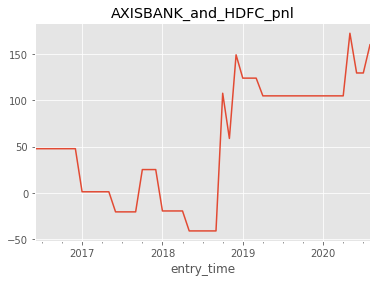

In [20]:
trade_sheet.set_index("entry_time").pnl.resample("M").sum().cumsum().plot()
plt.title("AXISBANK_and_HDFC_pnl")
plt.savefig("AXISBANK_and_HDFC_60_pnl.png")

plt.show()